<a href="https://colab.research.google.com/github/vamos-23/projects/blob/main/MajorProject2_CNN_MLP_Adrij.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Image Classification using CNN and MLP on MNIST and FashionMNIST Datasets**


#1) CNN IMPLEMENTATION

In [ ]:
import torch
import torchvision
import torch.nn as nn
from torch.utils.data import DataLoader
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
#Downloading MNIST dataset
training_dataset_MNIST = datasets.MNIST(root='./data', train=True,download=True, transform= transforms.ToTensor())
testing_dataset_MNIST = datasets.MNIST(root='./data', train = False, download = True, transform= transforms.ToTensor())
train_loader_MNIST = DataLoader(training_dataset_MNIST, batch_size= 64, shuffle=True)
test_loader_MNIST = DataLoader(testing_dataset_MNIST, batch_size= 64, shuffle=False)

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 9.91M/9.91M [00:00<00:00, 36.5MB/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 28.9k/28.9k [00:00<00:00, 1.52MB/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 1.65M/1.65M [00:00<00:00, 8.96MB/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 4.54k/4.54k [00:00<00:00, 2.99MB/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



In [ ]:
#Downloading FashionMNIST dataset
training_dataset_FashionMNIST = datasets.FashionMNIST(root='./data',train=True, download= True, transform = transforms.ToTensor())
testing_dataset_FashionMNIST = datasets.FashionMNIST(root='./data', train = False, download = True, transform = transforms.ToTensor())
train_loader_FashionMNIST = DataLoader(training_dataset_FashionMNIST, batch_size = 64, shuffle =True)
test_loader_FashionMNIST = DataLoader(testing_dataset_FashionMNIST, batch_size= 64, shuffle =False)

100%|██████████| 26.4M/26.4M [00:10<00:00, 2.54MB/s]


Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 29.5k/29.5k [00:00<00:00, 264kB/s]


Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 4.42M/4.42M [00:02<00:00, 2.04MB/s]


Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 5.15k/5.15k [00:00<00:00, 3.30MB/s]

Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



(3, 212, 302)


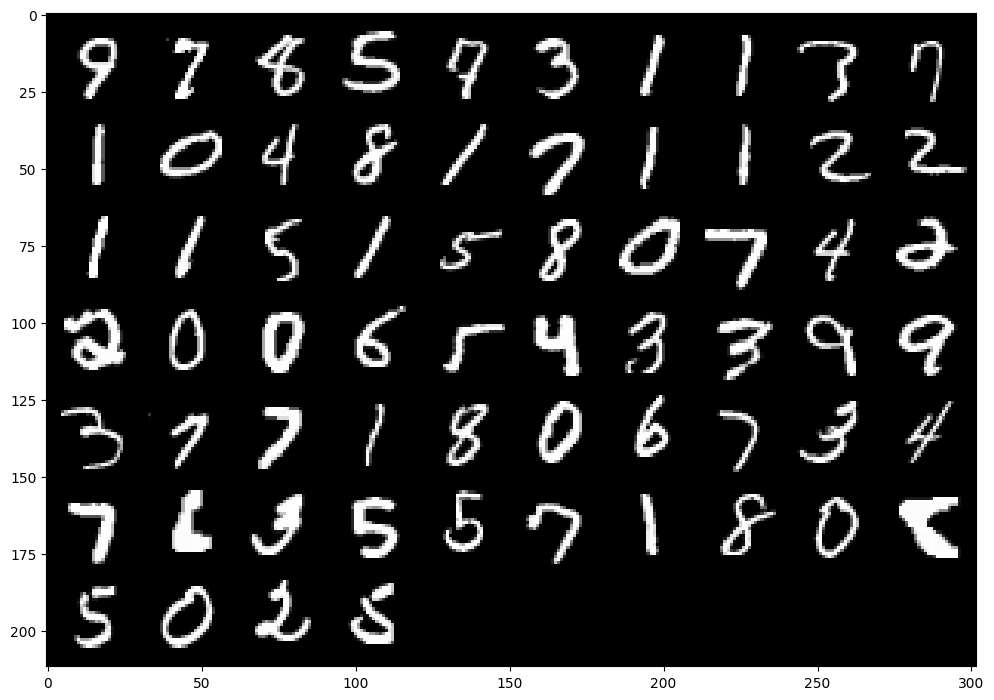

(212, 302, 3)


In [ ]:
#Visualizing some sample images from MNIST dataset
images_mnist, labels_mnist = next(iter(train_loader_MNIST))
img_grid_mnist = torchvision.utils.make_grid(images_mnist,nrow=10)
img_grid_mnist = img_grid_mnist.numpy()
print(img_grid_mnist.shape)
plt.figure(figsize=(12,12))
plt.imshow(img_grid_mnist.transpose(1,2,0))
plt.show()
print(np.transpose(img_grid_mnist,axes=(1,2,0)).shape)

(3, 212, 302)


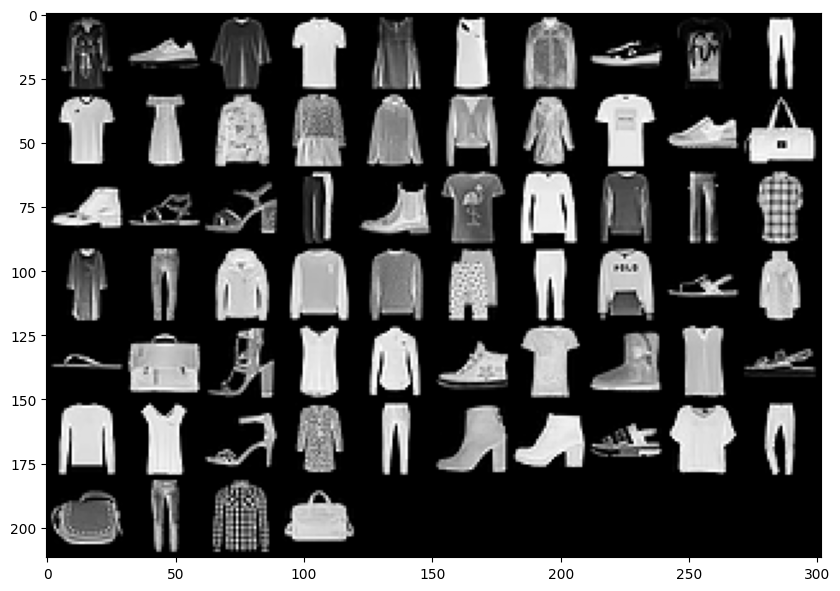

In [ ]:
#Visualizing some samples from FashionMNIST dataset
images_fashion,labels_fashion = next(iter(train_loader_FashionMNIST))
img_grid_fashion = torchvision.utils.make_grid(images_fashion,nrow=10);
img_grid_fashion = img_grid_fashion.numpy()
print(img_grid_fashion.shape)
plt.figure(figsize=(10,12))
plt.imshow(img_grid_fashion.transpose(1,2,0))
plt.show()
print(np.transpose(img_grid_fashion,axes=(1,2,0)).shape)

In [ ]:
#Building the model
class CNN_model(nn.Module):
  def __init__(self,hidden_size1,num_classes):
    super(CNN_model,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1,out_channels=32,kernel_size=3,stride=1,padding='same')
    self.relu1 = nn.ReLU()
    self.maxpool1 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.conv2 = nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3 ,stride=1,padding='same')
    self.relu2 = nn.ReLU()
    self.maxpool2 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.fc1 = nn.Linear(7*7*32,hidden_size1)
    self.relu3 = nn.ReLU()
    self.fc2 = nn.Linear(hidden_size1,num_classes)

  def forward(self,x):
    x = self.conv1(x)
    x = self.relu1(x)
    x = self.maxpool1(x)
    x = self.conv2(x)
    x = self.relu2(x)
    x = self.maxpool2(x)
    x = x.view(x.size(0),-1) #vectorizing the last convolution layer before predicting outputs
    x = self.fc1(x)
    x = self.relu3(x)
    x = self.fc2(x)
    return x

(212, 302, 3)


In [ ]:
#Creating instances of model
CNN_mnist=CNN_model(hidden_size1=128,num_classes=10)
def instance_mnist():
  CNN_mnist=CNN_model(hidden_size1=128,num_classes=10)
  torch.softmax(CNN_mnist(torch.randn(1,1,28,28)),dim=1)
  print(CNN_mnist)
  print("Number of parameters in MNIST:",sum(p.numel() for p in CNN_mnist.parameters()))

CNN_fashion=CNN_model(hidden_size1=128,num_classes=10)

def instance_fashion():
  CNN_fashion=CNN_model(hidden_size1=128,num_classes=10)
  torch.softmax(CNN_fashion(torch.randn(1,1,28,28)),dim=1)
  print(CNN_fashion)
  print("Number of parameters in FashionMNIST:",sum(p.numel() for p in CNN_fashion.parameters()))

In [ ]:
# Training the CNN model
def train_model(lr, images, labels, model_instance, train_Loader,test_Loader):
  criterion = nn.CrossEntropyLoss()
  optimizer = torch.optim.Adam(model_instance.parameters(), lr)
  epochs = 10
  loss_tracker=[]
  for i in range(epochs):
    for j,(images,labels) in enumerate(train_Loader):
      images = images.view(-1,1,28,28)
      outputs = model_instance(images)
      loss = criterion(outputs,labels)
      loss_tracker.append(loss.item())
      loss.backward()
      optimizer.step()
      optimizer.zero_grad()
      print(f"Epoch: {i+1}, Step: {j+1}/{len(train_Loader)}, Loss: {loss.item()}")
    #checking validation accuracy of each epoch
    correct=0
    total=0
    with torch.no_grad():
        for images,labels in test_Loader:
          images = images.view(-1,1,28,28)
          outputs = model_instance(images)
          _,predicted = torch.max(outputs.data,1)
          total+=labels.size(0)
          correct+=(predicted==labels).sum().item()
    print(f"Validation Accuracy: {100*correct/total:.2f}%")
  print()
  print("The mean loss is:",loss.mean())

  plt.plot(loss_tracker)
  plt.xlabel("Steps")
  plt.ylabel("Loss")
  plt.title("Dataset Training Insight")
  plt.show()

## ***Hyperparameter Experimentations***



# 1. MNIST dataset




Filter size = 32 , Kernel size = (3,3), lr1=0.001



Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.004238705150783062
Epoch: 5, Step: 638/938, Loss: 0.004661474376916885
Epoch: 5, Step: 639/938, Loss: 0.0039435760118067265
Epoch: 5, Step: 640/938, Loss: 0.0011352086439728737
Epoch: 5, Step: 641/938, Loss: 0.01006492879241705
Epoch: 5, Step: 642/938, Loss: 0.002074197866022587
Epoch: 5, Step: 643/938, Loss: 0.0037595212925225496
Epoch: 5, Step: 644/938, Loss: 0.0016457814490422606
Epoch: 5, Step: 645/938, Loss: 0.024159668013453484
Epoch: 5, Step: 646/938, Loss: 0.0020964585710316896
Epoch: 5, Step: 647/938, Loss: 0.003383923089131713
Epoch: 5, Step: 648/938, Loss: 0.016808968037366867
Epoch: 5, Step: 649/938, Loss: 0.001664237934164703
Epoch: 5, Step: 650/938, Loss: 0.07444127649068832
Epoch: 5, Step: 651/938, Loss: 0.004035390447825193
Epoch: 5, Step: 652/938, Loss: 0.04623822495341301
Epoch: 5, Step: 653/938, Loss: 0.003964007366448641
Epoch: 5, Step: 654/938, Loss: 0.03371791914105415
Epoch: 5, St

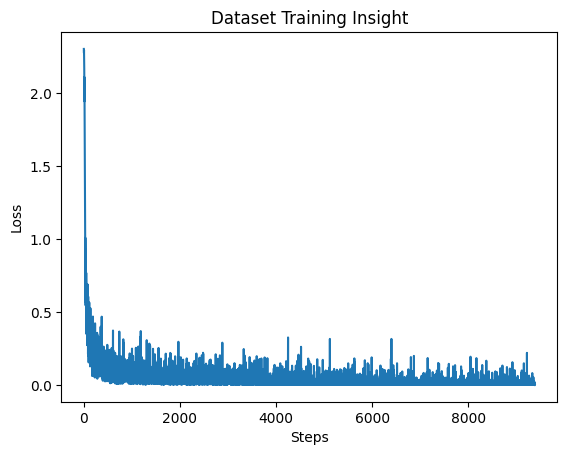

CNN_model(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=1568, out_features=128, bias=True)
  (relu3): ReLU()
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)
Number of parameters in MNIST: 211690


In [ ]:
class CNN_model(nn.Module):
  def __init__(self,hidden_size1,num_classes):
    super(CNN_model,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1,out_channels=32 ,kernel_size=3,stride=1,padding='same')
    self.relu1 = nn.ReLU()
    self.maxpool1 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.conv2 = nn.Conv2d(in_channels=32,out_channels=32, kernel_size=3 ,stride=1,padding='same')
    self.relu2 = nn.ReLU()
    self.maxpool2 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.fc1 = nn.Linear(7*7*32,hidden_size1)
    self.relu3 = nn.ReLU()
    self.fc2 = nn.Linear(hidden_size1,num_classes)

  def forward(self,x):
    x = self.conv1(x)
    x = self.relu1(x)
    x = self.maxpool1(x)
    x = self.conv2(x)
    x = self.relu2(x)
    x = self.maxpool2(x)
    x = x.view(x.size(0),-1) #vectorizing the last convolution layer before predicting outputs
    x = self.fc1(x)
    x = self.relu3(x)
    x = self.fc2(x)
    return x
train_model(lr=0.001, images=images_mnist, labels=labels_mnist, model_instance=CNN_mnist, train_Loader=train_loader_MNIST, test_Loader=test_loader_MNIST)
instance_mnist()

Filter Size = 32, Kernel size = (3,3), lr1=0.0001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.0001366136857541278
Epoch: 5, Step: 638/938, Loss: 0.00010553635365795344
Epoch: 5, Step: 639/938, Loss: 9.269299334846437e-05
Epoch: 5, Step: 640/938, Loss: 1.4382447261596099e-05
Epoch: 5, Step: 641/938, Loss: 9.293019684264436e-05
Epoch: 5, Step: 642/938, Loss: 1.8569573967397446e-06
Epoch: 5, Step: 643/938, Loss: 3.713173282449134e-05
Epoch: 5, Step: 644/938, Loss: 9.64182909228839e-05
Epoch: 5, Step: 645/938, Loss: 4.114040712011047e-05
Epoch: 5, Step: 646/938, Loss: 1.2109230738133192e-05
Epoch: 5, Step: 647/938, Loss: 8.01622991275508e-06
Epoch: 5, Step: 648/938, Loss: 0.0001648473262321204
Epoch: 5, Step: 649/938, Loss: 0.00482647679746151
Epoch: 5, Step: 650/938, Loss: 7.628714229213074e-05
Epoch: 5, Step: 651/938, Loss: 1.9261555280536413e-05
Epoch: 5, Step: 652/938, Loss: 4.896325663139578e-06
Epoch: 5, Step: 653/938, Loss: 4.8283116484526545e-05
Epoch: 5, Step: 654/938, Loss: 0.0013887907844

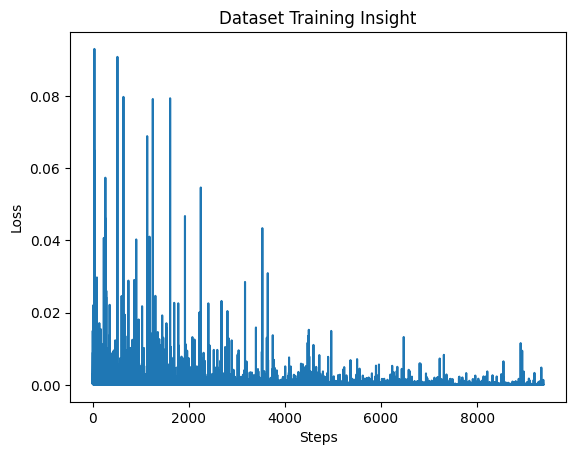

CNN_model(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=1568, out_features=128, bias=True)
  (relu3): ReLU()
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)
Number of parameters in MNIST: 211690


In [ ]:
class CNN_model(nn.Module):
  def __init__(self,hidden_size1,num_classes):
    super(CNN_model,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1,out_channels=32,kernel_size=3,stride=1,padding='same')
    self.relu1 = nn.ReLU()
    self.maxpool1 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.conv2 = nn.Conv2d(in_channels=32, out_channels=32,kernel_size=3,stride=1,padding='same')
    self.relu2 = nn.ReLU()
    self.maxpool2 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.fc1 = nn.Linear(7*7*32,hidden_size1)
    self.relu3 = nn.ReLU()
    self.fc2 = nn.Linear(hidden_size1,num_classes)

  def forward(self,x):
    x = self.conv1(x)
    x = self.relu1(x)
    x = self.maxpool1(x)
    x = self.conv2(x)
    x = self.relu2(x)
    x = self.maxpool2(x)
    x = x.view(x.size(0),-1) #vectorizing the last convolution layer before predicting outputs
    x = self.fc1(x)
    x = self.relu3(x)
    x = self.fc2(x)
    return x
train_model(lr=0.0001, images=images_mnist, labels=labels_mnist, model_instance=CNN_mnist, train_Loader=train_loader_MNIST, test_Loader=test_loader_MNIST)
instance_mnist()

Filter size = 32 , Kernel Size = (5,5), lr1=0.001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.0006091590621508658
Epoch: 5, Step: 638/938, Loss: 0.006804867181926966
Epoch: 5, Step: 639/938, Loss: 0.03105788864195347
Epoch: 5, Step: 640/938, Loss: 0.014421195723116398
Epoch: 5, Step: 641/938, Loss: 0.0048536998219788074
Epoch: 5, Step: 642/938, Loss: 0.00011347191320965067
Epoch: 5, Step: 643/938, Loss: 0.000796000414993614
Epoch: 5, Step: 644/938, Loss: 0.00014800573990214616
Epoch: 5, Step: 645/938, Loss: 0.005619091913104057
Epoch: 5, Step: 646/938, Loss: 0.00016776667325757444
Epoch: 5, Step: 647/938, Loss: 4.169826934230514e-05
Epoch: 5, Step: 648/938, Loss: 0.0013889711117371917
Epoch: 5, Step: 649/938, Loss: 0.017294127494096756
Epoch: 5, Step: 650/938, Loss: 9.058557770913467e-05
Epoch: 5, Step: 651/938, Loss: 0.0004491634317673743
Epoch: 5, Step: 652/938, Loss: 0.009030323475599289
Epoch: 5, Step: 653/938, Loss: 0.00017545043374411762
Epoch: 5, Step: 654/938, Loss: 0.009581614285707474


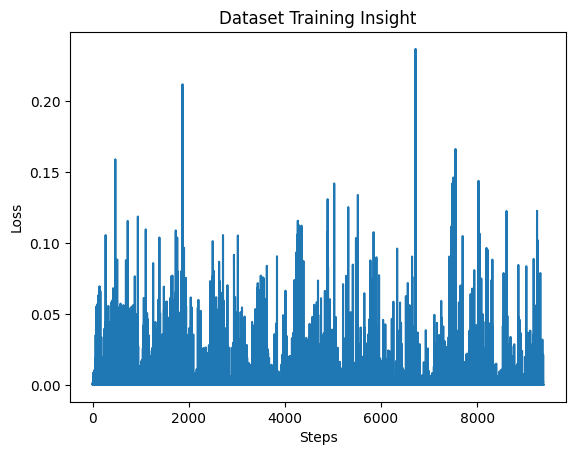

CNN_model(
  (conv1): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(32, 32, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=1568, out_features=128, bias=True)
  (relu3): ReLU()
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)
Number of parameters in MNIST: 228586


In [ ]:
class CNN_model(nn.Module):
  def __init__(self,hidden_size1,num_classes):
    super(CNN_model,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1,out_channels=32,kernel_size=5,stride=1,padding='same')
    self.relu1 = nn.ReLU()
    self.maxpool1 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.conv2 = nn.Conv2d(in_channels=32, out_channels=32,kernel_size=5,stride=1,padding='same')
    self.relu2 = nn.ReLU()
    self.maxpool2 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.fc1 = nn.Linear(7*7*32,hidden_size1)
    self.relu3 = nn.ReLU()
    self.fc2 = nn.Linear(hidden_size1,num_classes)

  def forward(self,x):
    x = self.conv1(x)
    x = self.relu1(x)
    x = self.maxpool1(x)
    x = self.conv2(x)
    x = self.relu2(x)
    x = self.maxpool2(x)
    x = x.view(x.size(0),-1) #vectorizing the last convolution layer before predicting outputs
    x = self.fc1(x)
    x = self.relu3(x)
    x = self.fc2(x)
    return x

train_model(lr=0.001, images=images_mnist, labels=labels_mnist, model_instance=CNN_mnist, train_Loader=train_loader_MNIST, test_Loader=test_loader_MNIST)
instance_mnist()

Filter size = 64, Kernel size = (3,3), lr1 = 0.001

Streaming output truncated to the last 5000 lines.
Epoch: 8, Step: 319/938, Loss: 0.005306077189743519
Epoch: 8, Step: 320/938, Loss: 7.577913038403494e-06
Epoch: 8, Step: 321/938, Loss: 7.91709953773534e-06
Epoch: 8, Step: 322/938, Loss: 7.275125244632363e-05
Epoch: 8, Step: 323/938, Loss: 0.0008697262383066118
Epoch: 8, Step: 324/938, Loss: 4.144110789638944e-06
Epoch: 8, Step: 321/938, Loss: 7.91709953773534e-06
Epoch: 8, Step: 322/938, Loss: 7.275125244632363e-05
Epoch: 8, Step: 323/938, Loss: 0.0008697262383066118
Epoch: 8, Step: 324/938, Loss: 4.144110789638944e-06
Epoch: 8, Step: 325/938, Loss: 0.03436419367790222
Epoch: 8, Step: 326/938, Loss: 7.062089935061522e-06
Epoch: 8, Step: 327/938, Loss: 0.0012344642309471965
Epoch: 8, Step: 328/938, Loss: 0.00031830696389079094
Epoch: 8, Step: 325/938, Loss: 0.03436419367790222
Epoch: 8, Step: 326/938, Loss: 7.062089935061522e-06
Epoch: 8, Step: 327/938, Loss: 0.0012344642309471965
Epoch: 8, Step: 328/938, Loss: 0.00031830696389079094


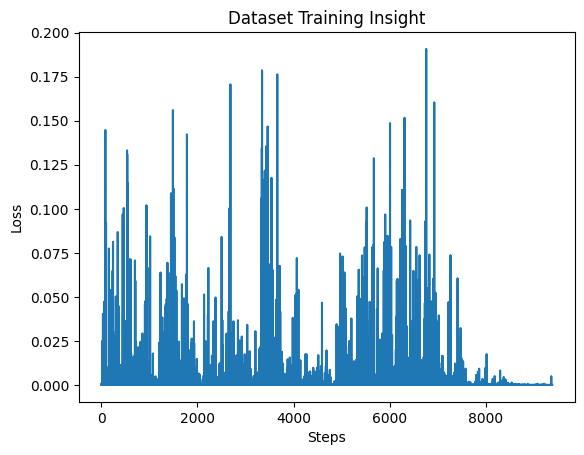

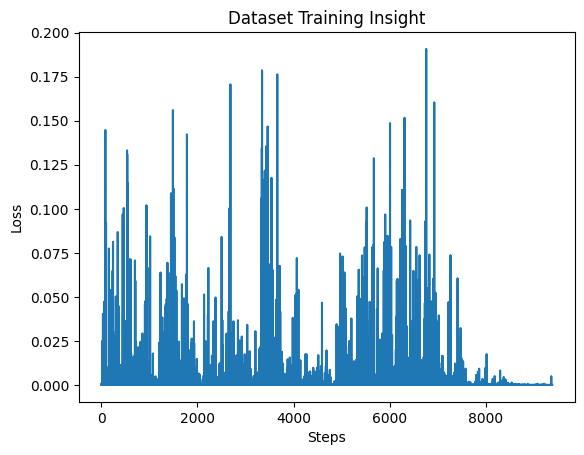

CNN_model(
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=3136, out_features=128, bias=True)
  (relu3): ReLU()
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)
Number of parameters in MNIST: 440394
CNN_model(
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=3136, out_features=128, bias=True)
  (relu

In [ ]:
class CNN_model(nn.Module):
  def __init__(self,hidden_size1,num_classes):
    super(CNN_model,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1,out_channels=64,kernel_size=3,stride=1,padding='same')
    self.relu1 = nn.ReLU()
    self.maxpool1 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.conv2 = nn.Conv2d(in_channels=64, out_channels=64,kernel_size=3,stride=1,padding='same')
    self.relu2 = nn.ReLU()
    self.maxpool2 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.fc1 = nn.Linear(7*7*64,hidden_size1)
    self.relu3 = nn.ReLU()
    self.fc2 = nn.Linear(hidden_size1,num_classes)

  def forward(self,x):
    x = self.conv1(x)
    x = self.relu1(x)
    x = self.maxpool1(x)
    x = self.conv2(x)
    x = self.relu2(x)
    x = self.maxpool2(x)
    x = x.view(x.size(0),-1) #vectorizing the last convolution layer before predicting outputs
    x = self.fc1(x)
    x = self.relu3(x)
    x = self.fc2(x)
    return x

train_model(lr=0.001, images=images_mnist, labels=labels_mnist, model_instance=CNN_mnist, train_Loader=train_loader_MNIST, test_Loader=test_loader_MNIST)
instance_mnist()

Filter size = 64, Kernel size = (3,3), lr1 = 0.0001

Streaming output truncated to the last 5000 lines.
Epoch: 8, Step: 319/938, Loss: 2.735997441050131e-06
Epoch: 8, Step: 320/938, Loss: 4.656608609820978e-08
Epoch: 8, Step: 321/938, Loss: 2.4400509346378385e-07
Epoch: 8, Step: 322/938, Loss: 1.7322527412488853e-07
Epoch: 8, Step: 323/938, Loss: 3.0098904062469956e-06
Epoch: 8, Step: 324/938, Loss: 7.823099679171719e-08
Epoch: 8, Step: 321/938, Loss: 2.4400509346378385e-07
Epoch: 8, Step: 322/938, Loss: 1.7322527412488853e-07
Epoch: 8, Step: 323/938, Loss: 3.0098904062469956e-06
Epoch: 8, Step: 324/938, Loss: 7.823099679171719e-08
Epoch: 8, Step: 325/938, Loss: 1.1734628202475506e-07
Epoch: 8, Step: 326/938, Loss: 1.169714209936501e-06
Epoch: 8, Step: 327/938, Loss: 3.9115498395858594e-08
Epoch: 8, Step: 328/938, Loss: 1.4901155864777138e-08
Epoch: 8, Step: 325/938, Loss: 1.1734628202475506e-07
Epoch: 8, Step: 326/938, Loss: 1.169714209936501e-06
Epoch: 8, Step: 327/938, Loss: 3.9115498395858594e-08
Epoch: 8, Step: 328/938, Loss: 1.4901

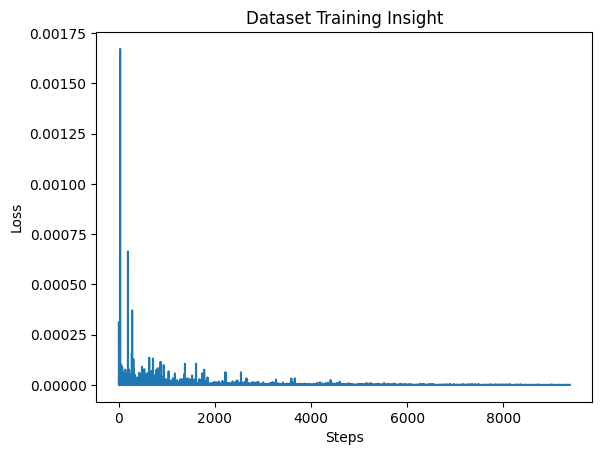

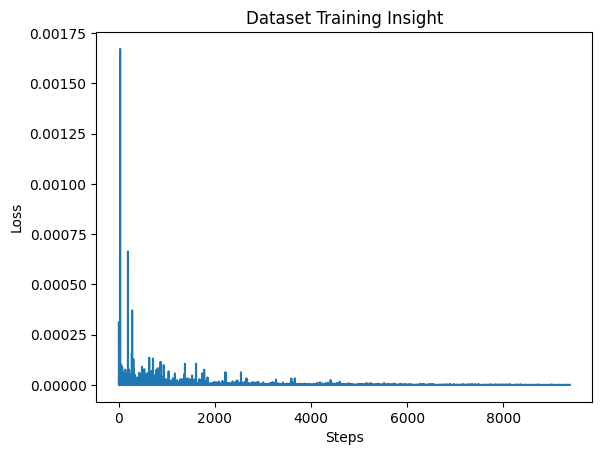

CNN_model(
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=3136, out_features=128, bias=True)
  (relu3): ReLU()
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)
Number of parameters in MNIST: 440394
CNN_model(
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=3136, out_features=128, bias=True)
  (relu

In [ ]:
class CNN_model(nn.Module):
  def __init__(self,hidden_size1,num_classes):
    super(CNN_model,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1,out_channels=64,kernel_size=3,stride=1,padding='same')
    self.relu1 = nn.ReLU()
    self.maxpool1 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.conv2 = nn.Conv2d(in_channels=64, out_channels=64,kernel_size=3,stride=1,padding='same')
    self.relu2 = nn.ReLU()
    self.maxpool2 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.fc1 = nn.Linear(7*7*64,hidden_size1)
    self.relu3 = nn.ReLU()
    self.fc2 = nn.Linear(hidden_size1,num_classes)

  def forward(self,x):
    x = self.conv1(x)
    x = self.relu1(x)
    x = self.maxpool1(x)
    x = self.conv2(x)
    x = self.relu2(x)
    x = self.maxpool2(x)
    x = x.view(x.size(0),-1) #vectorizing the last convolution layer before predicting outputs
    x = self.fc1(x)
    x = self.relu3(x)
    x = self.fc2(x)
    return x


train_model(lr=0.0001, images=images_mnist, labels=labels_mnist, model_instance=CNN_mnist, train_Loader=train_loader_MNIST, test_Loader=test_loader_MNIST)
instance_mnist()


Filter size = 64, Kernel size = (5,5), lr1=0.001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 7.96453605289571e-06
Epoch: 5, Step: 638/938, Loss: 1.383890662509657e-06
Epoch: 5, Step: 639/938, Loss: 8.381881855257234e-08
Epoch: 5, Step: 640/938, Loss: 2.6298409920855192e-06
Epoch: 5, Step: 641/938, Loss: 2.048908598339949e-08
Epoch: 5, Step: 642/938, Loss: 0.0
Epoch: 5, Step: 643/938, Loss: 9.126949862547917e-08
Epoch: 5, Step: 644/938, Loss: 0.00031965767266228795
Epoch: 5, Step: 645/938, Loss: 2.2351731132630448e-08
Epoch: 5, Step: 646/938, Loss: 2.2537196855410002e-06
Epoch: 5, Step: 647/938, Loss: 2.9429554615489906e-07
Epoch: 5, Step: 648/938, Loss: 1.918512708698472e-07
Epoch: 5, Step: 649/938, Loss: 0.0017565746093168855
Epoch: 5, Step: 650/938, Loss: 4.786924705513229e-07
Epoch: 5, Step: 651/938, Loss: 9.499468944795808e-08
Epoch: 5, Step: 652/938, Loss: 0.0003227035631425679
Epoch: 5, Step: 653/938, Loss: 4.526163763785007e-07
Epoch: 5, Step: 654/938, Loss: 0.0
Epoch: 5, Step: 655/938, Lo

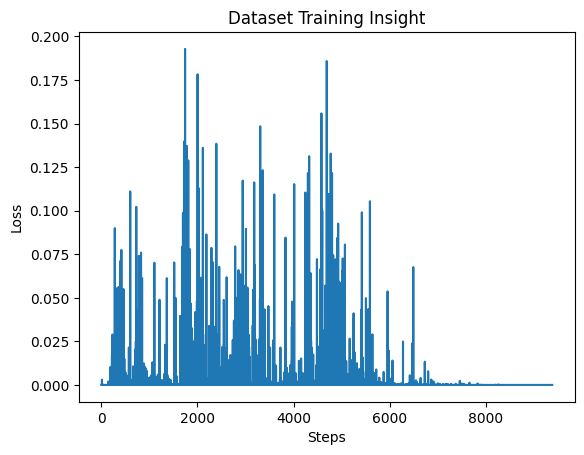

CNN_model(
  (conv1): Conv2d(1, 64, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 64, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=3136, out_features=128, bias=True)
  (relu3): ReLU()
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)
Number of parameters in MNIST: 506954


In [ ]:
class CNN_model(nn.Module):
  def __init__(self,hidden_size1,num_classes):
    super(CNN_model,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1,out_channels=64,kernel_size=5,stride=1,padding='same')
    self.relu1 = nn.ReLU()
    self.maxpool1 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.conv2 = nn.Conv2d(in_channels=64, out_channels=64,kernel_size=5,stride=1,padding='same')
    self.relu2 = nn.ReLU()
    self.maxpool2 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.fc1 = nn.Linear(7*7*64,hidden_size1)
    self.relu3 = nn.ReLU()
    self.fc2 = nn.Linear(hidden_size1,num_classes)

  def forward(self,x):
    x = self.conv1(x)
    x = self.relu1(x)
    x = self.maxpool1(x)
    x = self.conv2(x)
    x = self.relu2(x)
    x = self.maxpool2(x)
    x = x.view(x.size(0),-1) #vectorizing the last convolution layer before predicting outputs
    x = self.fc1(x)
    x = self.relu3(x)
    x = self.fc2(x)
    return x


train_model(lr=0.001, images=images_mnist, labels=labels_mnist, model_instance=CNN_mnist, train_Loader=train_loader_MNIST,test_Loader=test_loader_MNIST)
instance_mnist()

Filter size = 64, Kernel size = (5,5), lr1=0.0001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 1.6447809684905224e-05
Epoch: 5, Step: 638/938, Loss: 3.166493556250316e-08
Epoch: 5, Step: 639/938, Loss: 1.28522017917021e-07
Epoch: 5, Step: 640/938, Loss: 5.662366788783402e-07
Epoch: 5, Step: 641/938, Loss: 5.587934559514451e-09
Epoch: 5, Step: 642/938, Loss: 2.9988314054207876e-07
Epoch: 5, Step: 643/938, Loss: 2.5331775077575003e-07
Epoch: 5, Step: 644/938, Loss: 1.1175867342672063e-08
Epoch: 5, Step: 645/938, Loss: 0.0
Epoch: 5, Step: 646/938, Loss: 2.3005506591289304e-05
Epoch: 5, Step: 647/938, Loss: 4.600668432885868e-07
Epoch: 5, Step: 648/938, Loss: 1.2870626733274548e-06
Epoch: 5, Step: 649/938, Loss: 5.128568591317162e-05
Epoch: 5, Step: 650/938, Loss: 7.264306134402432e-08
Epoch: 5, Step: 651/938, Loss: 2.6077012549308165e-08
Epoch: 5, Step: 652/938, Loss: 3.166493556250316e-08
Epoch: 5, Step: 653/938, Loss: 9.313224857976365e-09
Epoch: 5, Step: 654/938, Loss: 3.539023651910611e-08
Epoch: 

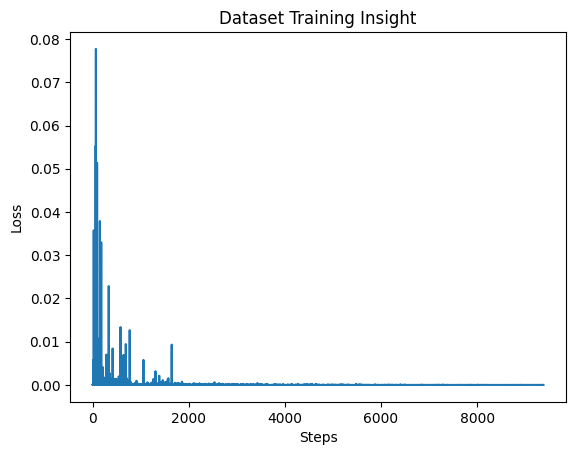

CNN_model(
  (conv1): Conv2d(1, 64, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 64, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=3136, out_features=128, bias=True)
  (relu3): ReLU()
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)
Number of parameters in MNIST: 506954


In [ ]:
class CNN_model(nn.Module):
  def __init__(self,hidden_size1,num_classes):
    super(CNN_model,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1,out_channels=64,kernel_size=5,stride=1,padding='same')
    self.relu1 = nn.ReLU()
    self.maxpool1 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.conv2 = nn.Conv2d(in_channels=64, out_channels=64,kernel_size=5,stride=1,padding='same')
    self.relu2 = nn.ReLU()
    self.maxpool2 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.fc1 = nn.Linear(7*7*64,hidden_size1)
    self.relu3 = nn.ReLU()
    self.fc2 = nn.Linear(hidden_size1,num_classes)

  def forward(self,x):
    x = self.conv1(x)
    x = self.relu1(x)
    x = self.maxpool1(x)
    x = self.conv2(x)
    x = self.relu2(x)
    x = self.maxpool2(x)
    x = x.view(x.size(0),-1) #vectorizing the last convolution layer before predicting outputs
    x = self.fc1(x)
    x = self.relu3(x)
    x = self.fc2(x)
    return x


train_model(lr=0.0001, images=images_mnist, labels=labels_mnist, model_instance=CNN_mnist, train_Loader=train_loader_MNIST, test_Loader=test_loader_MNIST)
instance_mnist()

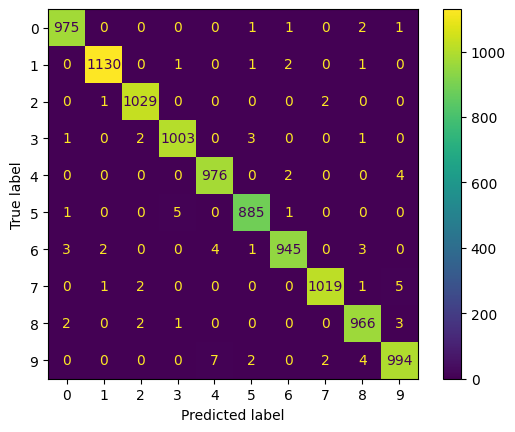

In [ ]:
#Confusion matrix for CNN model-MNIST dataset
import torch
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import numpy as np
correct =[]
predictions = []
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
CNN_mnist = CNN_mnist.to(device)

with torch.no_grad():
    for images, labels in test_loader_MNIST:
        images, labels = images.to(device), labels.to(device)
        images = images.view(-1, 1, 28, 28)
        outputs = CNN_mnist(images)
        _, predicted = torch.max(outputs.data, 1)

        correct.extend(labels.cpu().numpy())
        predictions.extend(predicted.cpu().numpy())
cm = confusion_matrix(correct, predictions)
ConfusionMatrixDisplay(cm).plot()
plt.show()



#2. FashionMNIST dataset

Filter size = 32, Kernel size = (3,3), lr2=0.001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.15075471997261047
Epoch: 5, Step: 638/938, Loss: 0.12037000060081482
Epoch: 5, Step: 639/938, Loss: 0.36465081572532654
Epoch: 5, Step: 640/938, Loss: 0.1564709097146988
Epoch: 5, Step: 641/938, Loss: 0.2658473551273346
Epoch: 5, Step: 642/938, Loss: 0.19810035824775696
Epoch: 5, Step: 643/938, Loss: 0.17878535389900208
Epoch: 5, Step: 644/938, Loss: 0.32123127579689026
Epoch: 5, Step: 645/938, Loss: 0.10690214484930038
Epoch: 5, Step: 646/938, Loss: 0.16638249158859253
Epoch: 5, Step: 647/938, Loss: 0.12878721952438354
Epoch: 5, Step: 648/938, Loss: 0.3250136077404022
Epoch: 5, Step: 649/938, Loss: 0.2730831205844879
Epoch: 5, Step: 650/938, Loss: 0.2098420262336731
Epoch: 5, Step: 651/938, Loss: 0.20688654482364655
Epoch: 5, Step: 652/938, Loss: 0.10417535156011581
Epoch: 5, Step: 653/938, Loss: 0.31366801261901855
Epoch: 5, Step: 654/938, Loss: 0.20765070617198944
Epoch: 5, Step: 655/938, Loss: 0.299

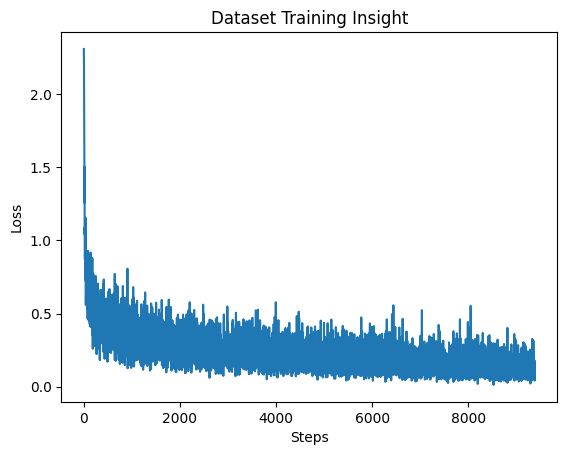

CNN_model(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=1568, out_features=128, bias=True)
  (relu3): ReLU()
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)
Number of parameters in FashionMNIST: 211690


In [ ]:
class CNN_model(nn.Module):
  def __init__(self,hidden_size1,num_classes):
    super(CNN_model,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1,out_channels=32 ,kernel_size=3,stride=1,padding='same')
    self.relu1 = nn.ReLU()
    self.maxpool1 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.conv2 = nn.Conv2d(in_channels=32,out_channels=32, kernel_size=3 ,stride=1,padding='same')
    self.relu2 = nn.ReLU()
    self.maxpool2 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.fc1 = nn.Linear(7*7*32,hidden_size1)
    self.relu3 = nn.ReLU()
    self.fc2 = nn.Linear(hidden_size1,num_classes)

  def forward(self,x):
    x = self.conv1(x)
    x = self.relu1(x)
    x = self.maxpool1(x)
    x = self.conv2(x)
    x = self.relu2(x)
    x = self.maxpool2(x)
    x = x.view(x.size(0),-1) #vectorizing the last convolution layer before predicting outputs
    x = self.fc1(x)
    x = self.relu3(x)
    x = self.fc2(x)
    return x

train_model(lr=0.001, images=images_fashion, labels=labels_fashion, model_instance=CNN_fashion, train_Loader=train_loader_FashionMNIST, test_Loader=test_loader_FashionMNIST)
instance_fashion()

Filter size = 32, Kernel size = (3,3), lr2=0.0001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.042408090084791183
Epoch: 5, Step: 638/938, Loss: 0.1256338506937027
Epoch: 5, Step: 639/938, Loss: 0.04906971752643585
Epoch: 5, Step: 640/938, Loss: 0.17588858306407928
Epoch: 5, Step: 641/938, Loss: 0.03797013312578201
Epoch: 5, Step: 642/938, Loss: 0.020992062985897064
Epoch: 5, Step: 643/938, Loss: 0.08046591281890869
Epoch: 5, Step: 644/938, Loss: 0.067963607609272
Epoch: 5, Step: 645/938, Loss: 0.1488451063632965
Epoch: 5, Step: 646/938, Loss: 0.08567214012145996
Epoch: 5, Step: 647/938, Loss: 0.0641954094171524
Epoch: 5, Step: 648/938, Loss: 0.03709772974252701
Epoch: 5, Step: 649/938, Loss: 0.19401726126670837
Epoch: 5, Step: 650/938, Loss: 0.056640625
Epoch: 5, Step: 651/938, Loss: 0.05722082033753395
Epoch: 5, Step: 652/938, Loss: 0.06534786522388458
Epoch: 5, Step: 653/938, Loss: 0.03592997416853905
Epoch: 5, Step: 654/938, Loss: 0.059860508888959885
Epoch: 5, Step: 655/938, Loss: 0.11012498

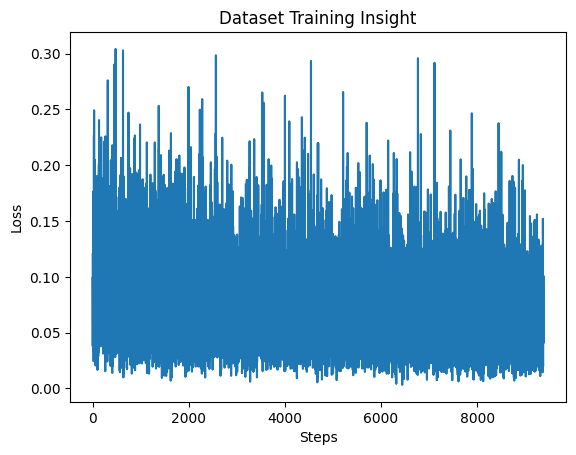

CNN_model(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=1568, out_features=128, bias=True)
  (relu3): ReLU()
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)
Number of parameters in FashionMNIST: 211690


In [ ]:
class CNN_model(nn.Module):
  def __init__(self,hidden_size1,num_classes):
    super(CNN_model,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1,out_channels=32 ,kernel_size=3,stride=1,padding='same')
    self.relu1 = nn.ReLU()
    self.maxpool1 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.conv2 = nn.Conv2d(in_channels=32,out_channels=32, kernel_size=3 ,stride=1,padding='same')
    self.relu2 = nn.ReLU()
    self.maxpool2 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.fc1 = nn.Linear(7*7*32,hidden_size1)
    self.relu3 = nn.ReLU()
    self.fc2 = nn.Linear(hidden_size1,num_classes)

  def forward(self,x):
    x = self.conv1(x)
    x = self.relu1(x)
    x = self.maxpool1(x)
    x = self.conv2(x)
    x = self.relu2(x)
    x = self.maxpool2(x)
    x = x.view(x.size(0),-1) #vectorizing the last convolution layer before predicting outputs
    x = self.fc1(x)
    x = self.relu3(x)
    x = self.fc2(x)
    return x

train_model(lr=0.0001, images=images_fashion, labels=labels_fashion, model_instance=CNN_fashion, train_Loader=train_loader_FashionMNIST,test_Loader=test_loader_FashionMNIST)
instance_fashion()

Filter size = 32, Kernel size = (5,5), lr2=0.001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.09069443494081497
Epoch: 5, Step: 638/938, Loss: 0.07443372160196304
Epoch: 5, Step: 639/938, Loss: 0.10299040377140045
Epoch: 5, Step: 640/938, Loss: 0.08323556929826736
Epoch: 5, Step: 641/938, Loss: 0.052914317697286606
Epoch: 5, Step: 642/938, Loss: 0.05479923263192177
Epoch: 5, Step: 643/938, Loss: 0.07214859127998352
Epoch: 5, Step: 644/938, Loss: 0.11873876303434372
Epoch: 5, Step: 645/938, Loss: 0.006343903951346874
Epoch: 5, Step: 646/938, Loss: 0.024803198873996735
Epoch: 5, Step: 647/938, Loss: 0.15806794166564941
Epoch: 5, Step: 648/938, Loss: 0.05840757489204407
Epoch: 5, Step: 649/938, Loss: 0.04671400040388107
Epoch: 5, Step: 650/938, Loss: 0.02161671780049801
Epoch: 5, Step: 651/938, Loss: 0.11685041338205338
Epoch: 5, Step: 652/938, Loss: 0.03649567440152168
Epoch: 5, Step: 653/938, Loss: 0.06398415565490723
Epoch: 5, Step: 654/938, Loss: 0.03454276919364929
Epoch: 5, Step: 655/938, Los

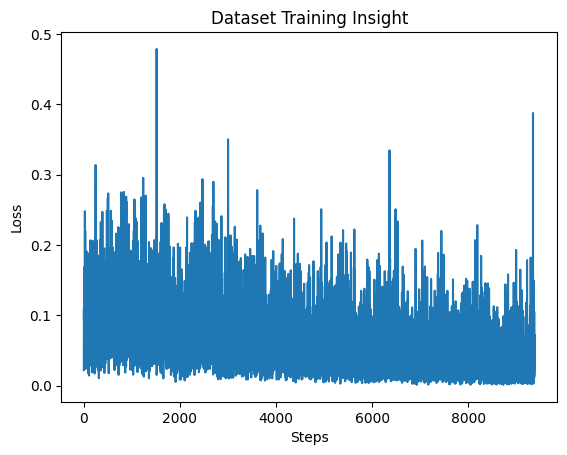

CNN_model(
  (conv1): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(32, 32, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=1568, out_features=128, bias=True)
  (relu3): ReLU()
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)
Number of parameters in FashionMNIST: 228586


In [ ]:
class CNN_model(nn.Module):
  def __init__(self,hidden_size1,num_classes):
    super(CNN_model,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1,out_channels=32 ,kernel_size=5,stride=1,padding='same')
    self.relu1 = nn.ReLU()
    self.maxpool1 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.conv2 = nn.Conv2d(in_channels=32,out_channels=32, kernel_size=5 ,stride=1,padding='same')
    self.relu2 = nn.ReLU()
    self.maxpool2 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.fc1 = nn.Linear(7*7*32,hidden_size1)
    self.relu3 = nn.ReLU()
    self.fc2 = nn.Linear(hidden_size1,num_classes)

  def forward(self,x):
    x = self.conv1(x)
    x = self.relu1(x)
    x = self.maxpool1(x)
    x = self.conv2(x)
    x = self.relu2(x)
    x = self.maxpool2(x)
    x = x.view(x.size(0),-1) #vectorizing the last convolution layer before predicting outputs
    x = self.fc1(x)
    x = self.relu3(x)
    x = self.fc2(x)
    return x

train_model(lr=0.001, images=images_fashion, labels=labels_fashion, model_instance=CNN_fashion, train_Loader=train_loader_FashionMNIST, test_Loader=test_loader_FashionMNIST)
instance_fashion()

Filter size = 64, Kernel size = (3,3), lr2=0.001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.020579416304826736
Epoch: 5, Step: 638/938, Loss: 0.017380179837346077
Epoch: 5, Step: 639/938, Loss: 0.06000274047255516
Epoch: 5, Step: 640/938, Loss: 0.006815707311034203
Epoch: 5, Step: 641/938, Loss: 0.003917342517524958
Epoch: 5, Step: 642/938, Loss: 0.07303671538829803
Epoch: 5, Step: 643/938, Loss: 0.05518920719623566
Epoch: 5, Step: 644/938, Loss: 0.0037087351083755493
Epoch: 5, Step: 645/938, Loss: 0.005581006873399019
Epoch: 5, Step: 646/938, Loss: 0.0075957756489515305
Epoch: 5, Step: 647/938, Loss: 0.07360170781612396
Epoch: 5, Step: 648/938, Loss: 0.014180448837578297
Epoch: 5, Step: 649/938, Loss: 0.024272914975881577
Epoch: 5, Step: 650/938, Loss: 0.013026113621890545
Epoch: 5, Step: 651/938, Loss: 0.052963342517614365
Epoch: 5, Step: 652/938, Loss: 0.009913763962686062
Epoch: 5, Step: 653/938, Loss: 0.00414410000666976
Epoch: 5, Step: 654/938, Loss: 0.029352430254220963
Epoch: 5, Step: 

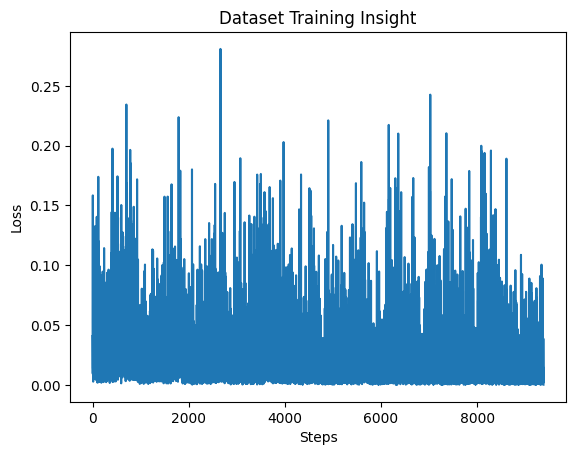

CNN_model(
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=3136, out_features=128, bias=True)
  (relu3): ReLU()
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)
Number of parameters in FashionMNIST: 440394


In [ ]:
class CNN_model(nn.Module):
  def __init__(self,hidden_size1,num_classes):
    super(CNN_model,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1,out_channels=64 ,kernel_size=3,stride=1,padding='same')
    self.relu1 = nn.ReLU()
    self.maxpool1 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.conv2 = nn.Conv2d(in_channels=64,out_channels=64, kernel_size=3 ,stride=1,padding='same')
    self.relu2 = nn.ReLU()
    self.maxpool2 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.fc1 = nn.Linear(7*7*64,hidden_size1)
    self.relu3 = nn.ReLU()
    self.fc2 = nn.Linear(hidden_size1,num_classes)

  def forward(self,x):
    x = self.conv1(x)
    x = self.relu1(x)
    x = self.maxpool1(x)
    x = self.conv2(x)
    x = self.relu2(x)
    x = self.maxpool2(x)
    x = x.view(x.size(0),-1) #vectorizing the last convolution layer before predicting outputs
    x = self.fc1(x)
    x = self.relu3(x)
    x = self.fc2(x)
    return x

train_model(lr=0.001, images=images_fashion, labels=labels_fashion, model_instance=CNN_fashion, train_Loader=train_loader_FashionMNIST, test_Loader=test_loader_FashionMNIST)
instance_fashion()

Filter size = 64, Kernel size = (3,3), lr2=0.0001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.0003401508729439229
Epoch: 5, Step: 638/938, Loss: 0.0001243908191099763
Epoch: 5, Step: 639/938, Loss: 0.0023783377837389708
Epoch: 5, Step: 640/938, Loss: 0.002451664302498102
Epoch: 5, Step: 641/938, Loss: 0.0001369095843983814
Epoch: 5, Step: 642/938, Loss: 0.00012156985030742362
Epoch: 5, Step: 643/938, Loss: 0.0011898805387318134
Epoch: 5, Step: 644/938, Loss: 0.001068749581463635
Epoch: 5, Step: 645/938, Loss: 0.0002918230020441115
Epoch: 5, Step: 646/938, Loss: 0.00014404217654373497
Epoch: 5, Step: 647/938, Loss: 0.00017981225391849875
Epoch: 5, Step: 648/938, Loss: 0.00015481434820685536
Epoch: 5, Step: 649/938, Loss: 1.70069561136188e-05
Epoch: 5, Step: 650/938, Loss: 0.0004897927865386009
Epoch: 5, Step: 651/938, Loss: 0.0017157922266051173
Epoch: 5, Step: 652/938, Loss: 0.00029193476075306535
Epoch: 5, Step: 653/938, Loss: 0.00012406741734594107
Epoch: 5, Step: 654/938, Loss: 6.110365939093

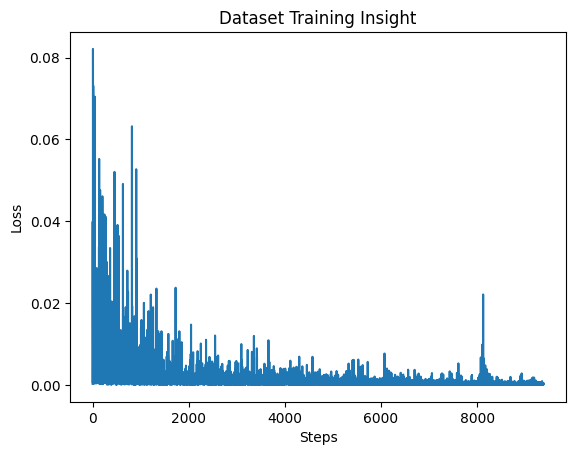

CNN_model(
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=3136, out_features=128, bias=True)
  (relu3): ReLU()
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)
Number of parameters in FashionMNIST: 440394


In [ ]:
class CNN_model(nn.Module):
  def __init__(self,hidden_size1,num_classes):
    super(CNN_model,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1,out_channels=64 ,kernel_size=3,stride=1,padding='same')
    self.relu1 = nn.ReLU()
    self.maxpool1 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.conv2 = nn.Conv2d(in_channels=64,out_channels=64, kernel_size=3 ,stride=1,padding='same')
    self.relu2 = nn.ReLU()
    self.maxpool2 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.fc1 = nn.Linear(7*7*64,hidden_size1)
    self.relu3 = nn.ReLU()
    self.fc2 = nn.Linear(hidden_size1,num_classes)

  def forward(self,x):
    x = self.conv1(x)
    x = self.relu1(x)
    x = self.maxpool1(x)
    x = self.conv2(x)
    x = self.relu2(x)
    x = self.maxpool2(x)
    x = x.view(x.size(0),-1) #vectorizing the last convolution layer before predicting outputs
    x = self.fc1(x)
    x = self.relu3(x)
    x = self.fc2(x)
    return x

train_model(lr=0.0001, images=images_fashion, labels=labels_fashion, model_instance=CNN_fashion, train_Loader=train_loader_FashionMNIST, test_Loader=test_loader_FashionMNIST)
instance_fashion()

Filter size = 64, Kernel size = (5,5), lr2=0.001


Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.03882095217704773
Epoch: 5, Step: 638/938, Loss: 0.0015900033758953214
Epoch: 5, Step: 639/938, Loss: 0.056126341223716736
Epoch: 5, Step: 640/938, Loss: 0.019986450672149658
Epoch: 5, Step: 641/938, Loss: 0.052023693919181824
Epoch: 5, Step: 642/938, Loss: 0.00883699581027031
Epoch: 5, Step: 643/938, Loss: 0.011170784011483192
Epoch: 5, Step: 644/938, Loss: 0.07037253677845001
Epoch: 5, Step: 645/938, Loss: 0.0010244289878755808
Epoch: 5, Step: 646/938, Loss: 0.00014737331366632134
Epoch: 5, Step: 647/938, Loss: 0.10937606543302536
Epoch: 5, Step: 648/938, Loss: 0.00892952736467123
Epoch: 5, Step: 649/938, Loss: 0.001799911493435502
Epoch: 5, Step: 650/938, Loss: 0.0006916518905200064
Epoch: 5, Step: 651/938, Loss: 0.01559468824416399
Epoch: 5, Step: 652/938, Loss: 0.030657267197966576
Epoch: 5, Step: 653/938, Loss: 0.0003461123560555279
Epoch: 5, Step: 654/938, Loss: 0.003780282335355878
Epoch: 5, Ste

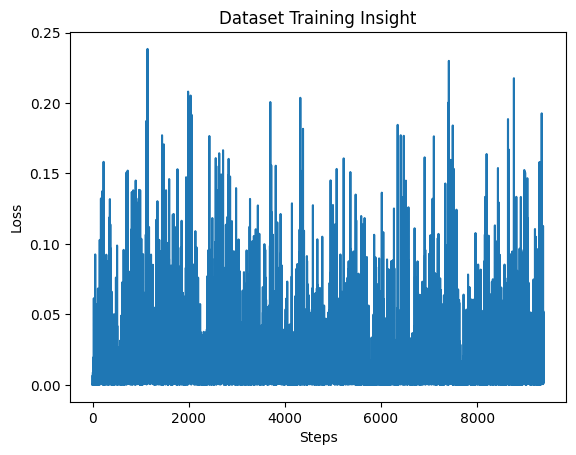

CNN_model(
  (conv1): Conv2d(1, 64, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 64, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=3136, out_features=128, bias=True)
  (relu3): ReLU()
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)
Number of parameters in FashionMNIST: 506954


In [ ]:
class CNN_model(nn.Module):
  def __init__(self,hidden_size1,num_classes):
    super(CNN_model,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1,out_channels=64 ,kernel_size=5,stride=1,padding='same')
    self.relu1 = nn.ReLU()
    self.maxpool1 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.conv2 = nn.Conv2d(in_channels=64,out_channels=64, kernel_size=5 ,stride=1,padding='same')
    self.relu2 = nn.ReLU()
    self.maxpool2 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.fc1 = nn.Linear(7*7*64,hidden_size1)
    self.relu3 = nn.ReLU()
    self.fc2 = nn.Linear(hidden_size1,num_classes)

  def forward(self,x):
    x = self.conv1(x)
    x = self.relu1(x)
    x = self.maxpool1(x)
    x = self.conv2(x)
    x = self.relu2(x)
    x = self.maxpool2(x)
    x = x.view(x.size(0),-1) #vectorizing the last convolution layer before predicting outputs
    x = self.fc1(x)
    x = self.relu3(x)
    x = self.fc2(x)
    return x

train_model(lr=0.001, images=images_fashion, labels=labels_fashion, model_instance=CNN_fashion, train_Loader=train_loader_FashionMNIST,test_Loader=test_loader_FashionMNIST)
instance_fashion()

Filter size = 64, Kernel size = (5,5), lr2=0.0001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.00015966087812557817
Epoch: 5, Step: 638/938, Loss: 0.0007730038487352431
Epoch: 5, Step: 639/938, Loss: 0.0001260328572243452
Epoch: 5, Step: 640/938, Loss: 0.0005124469753354788
Epoch: 5, Step: 641/938, Loss: 0.00018100532179232687
Epoch: 5, Step: 642/938, Loss: 0.00019941687060054392
Epoch: 5, Step: 643/938, Loss: 2.0039567971252836e-05
Epoch: 5, Step: 644/938, Loss: 0.00010020135960076004
Epoch: 5, Step: 645/938, Loss: 0.0004678036202676594
Epoch: 5, Step: 646/938, Loss: 2.825512274284847e-05
Epoch: 5, Step: 647/938, Loss: 0.0007546665729023516
Epoch: 5, Step: 648/938, Loss: 0.00040070657269097865
Epoch: 5, Step: 649/938, Loss: 0.00020968726312275976
Epoch: 5, Step: 650/938, Loss: 0.00010390701936557889
Epoch: 5, Step: 651/938, Loss: 2.6579262339510024e-05
Epoch: 5, Step: 652/938, Loss: 0.00013605070125777274
Epoch: 5, Step: 653/938, Loss: 9.59800963755697e-05
Epoch: 5, Step: 654/938, Loss: 5.614928

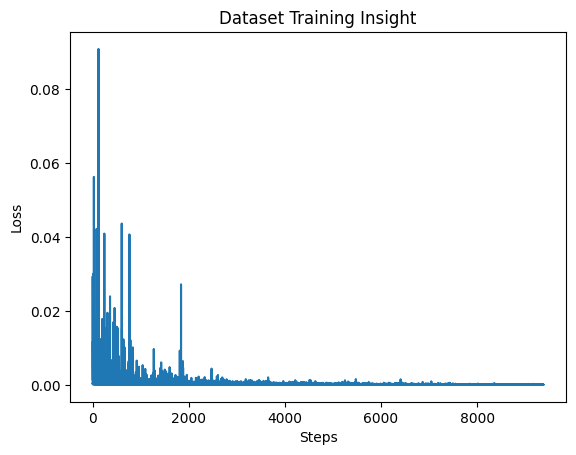

CNN_model(
  (conv1): Conv2d(1, 64, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 64, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=3136, out_features=128, bias=True)
  (relu3): ReLU()
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)
Number of parameters in FashionMNIST: 506954


In [ ]:
class CNN_model(nn.Module):
  def __init__(self,hidden_size1,num_classes):
    super(CNN_model,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1,out_channels=64 ,kernel_size=5,stride=1,padding='same')
    self.relu1 = nn.ReLU()
    self.maxpool1 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.conv2 = nn.Conv2d(in_channels=64,out_channels=64, kernel_size=5 ,stride=1,padding='same')
    self.relu2 = nn.ReLU()
    self.maxpool2 = nn.MaxPool2d(kernel_size=2,stride=2)
    self.fc1 = nn.Linear(7*7*64,hidden_size1)
    self.relu3 = nn.ReLU()
    self.fc2 = nn.Linear(hidden_size1,num_classes)

  def forward(self,x):
    x = self.conv1(x)
    x = self.relu1(x)
    x = self.maxpool1(x)
    x = self.conv2(x)
    x = self.relu2(x)
    x = self.maxpool2(x)
    x = x.view(x.size(0),-1) #vectorizing the last convolution layer before predicting outputs
    x = self.fc1(x)
    x = self.relu3(x)
    x = self.fc2(x)
    return x

train_model(lr=0.0001, images=images_fashion, labels=labels_fashion, model_instance=CNN_fashion, train_Loader=train_loader_FashionMNIST, test_Loader=test_loader_FashionMNIST)
instance_fashion()

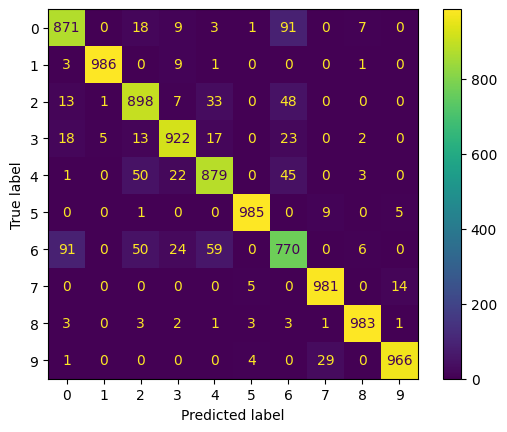

In [ ]:
#Confusion matrix for CNN model-FashionMNIST dataset
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import numpy as np
correct = []
predictions = []
with torch.no_grad():
  for images,labels in test_loader_FashionMNIST:
    images = images.view(-1,1,28,28)
    outputs = CNN_fashion(images)
    _,predicted = torch.max(outputs.data,1)
    correct.extend(labels.numpy())
    predictions.extend(predicted.numpy())
cm = confusion_matrix(correct, predictions)
ConfusionMatrixDisplay(cm).plot()

#2) MLP IMPLEMENTATION

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader

In [ ]:
#Downloading MNIST dataset
train_dataset_mnist=datasets.MNIST(root='./data',train=True,download=True,transform=transforms.ToTensor())
test_dataset_mnist=datasets.MNIST(root='./data',train=False,download=True,transform=transforms.ToTensor())
train_loader_mnist=DataLoader(dataset = train_dataset_mnist, batch_size=64, shuffle=True)
test_loader_mnist=DataLoader(dataset = test_dataset_mnist, batch_size=64, shuffle=False)

In [ ]:
#Downloading FashionMNIST dataset
train_dataset_fashion=datasets.FashionMNIST(root='./data',train=True,download=True,transform=transforms.ToTensor())
test_dataset_fashion=datasets.FashionMNIST(root='./data',train=False,download=True,transform=transforms.ToTensor())
train_loader_fashion=DataLoader(dataset = train_dataset_fashion, batch_size=64, shuffle=True)
test_loader_fashion=DataLoader(dataset = test_dataset_fashion, batch_size=64, shuffle=False)

(3, 212, 302)


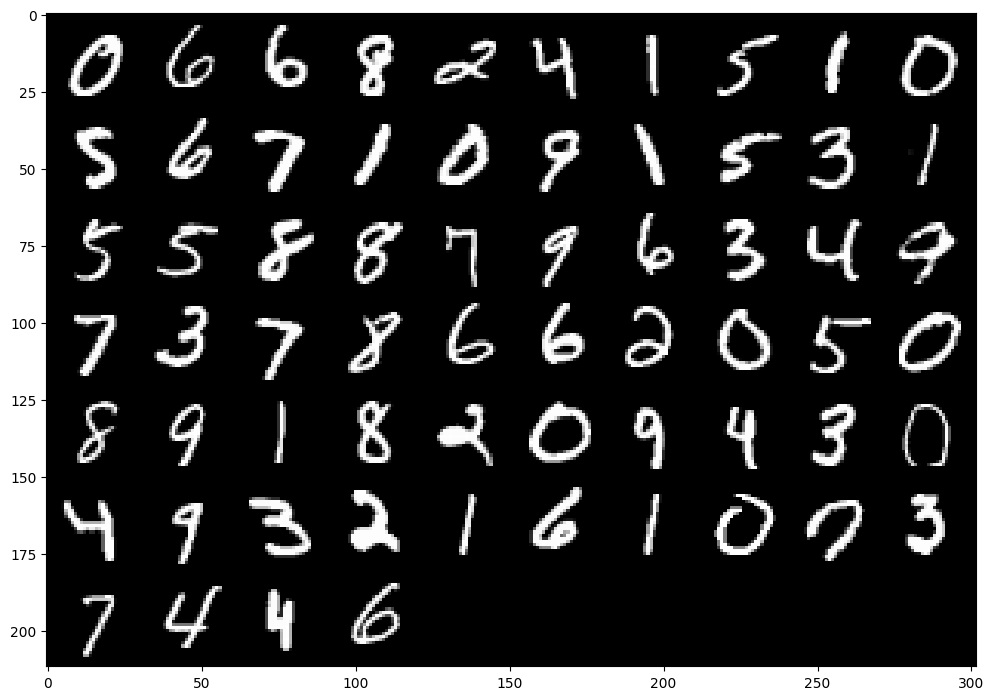

(212, 302, 3)


In [ ]:
#Visualizing some sample images from MNIST dataset
images_mnist, labels_mnist = next(iter(train_loader_mnist))
img_grid_mnist = torchvision.utils.make_grid(images_mnist,nrow=10)
img_grid_mnist = img_grid_mnist.numpy()
print(img_grid_mnist.shape)
plt.figure(figsize=(12,12))
plt.imshow(img_grid_mnist.transpose(1,2,0))
plt.show()
print(np.transpose(img_grid_mnist,axes=(1,2,0)).shape)

(3, 212, 302)


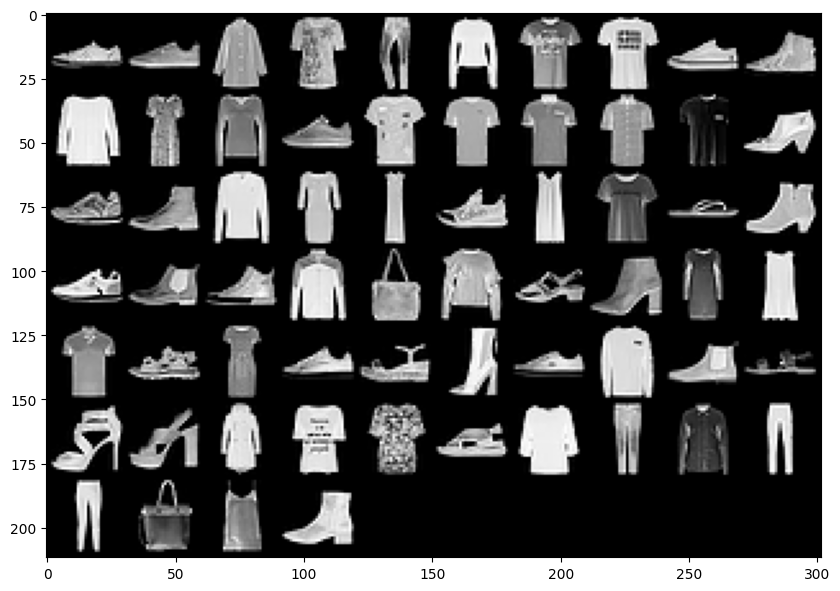

(212, 302, 3)


In [ ]:
#Visualizing some samples from FashionMNIST dataset
images_fashion,labels_fashion = next(iter(train_loader_fashion))
img_grid_fashion = torchvision.utils.make_grid(images_fashion,nrow=10);
img_grid_fashion = img_grid_fashion.numpy()
print(img_grid_fashion.shape)
plt.figure(figsize=(10,12))
plt.imshow(img_grid_fashion.transpose(1,2,0))
plt.show()
print(np.transpose(img_grid_fashion,axes=(1,2,0)).shape)

In [ ]:
#Building the MLP model
class MLP_model(nn.Module):
  def __init__(self,input_size,dropout_rate,hidden_size1,hidden_size2,num_classes):
    super(MLP_model,self).__init__()
    self.fc1 = nn.Linear(input_size,hidden_size1)
    self.relu1 = nn.ReLU()
    self.dropout = nn.Dropout(dropout_rate) #for regularization
    self.fc2 = nn.Linear(hidden_size1,hidden_size2)
    self.relu2 = nn.ReLU()
    self.fc3 = nn.Linear(hidden_size2,num_classes)
    self.Model = nn.Sequential(self.fc1,self.relu1,self.dropout,self.fc2,self.relu2,self.fc3)

  def forward(self,x):
      x = x.view(x.size(0),-1)
      x = self.Model(x)
      return x

In [ ]:
def instance_mnist(input_size,dropout_rate,hidden_size1, hidden_size2,num_classes):
    MLP_mnist = MLP_model(input_size,dropout_rate,hidden_size1,hidden_size2,num_classes)
    torch.softmax(MLP_mnist.fc3.weight,dim=1)
    return MLP_mnist

def instance_fashion(input_size, dropout_rate,hidden_size1, hidden_size2, num_classes):
    MLP_fashion = MLP_model(input_size,dropout_rate,hidden_size1,hidden_size2,num_classes)
    torch.softmax(MLP_fashion.fc3.weight,dim=1)
    return MLP_fashion

def model_info(input_size,dropout_rate,hidden_size1,hidden_size2,num_classes):
  MLP_instance = MLP_model(input_size,dropout_rate,hidden_size1,hidden_size2,num_classes)
  print(MLP_instance)
  print("Number of paramters:",sum(p.numel() for p in MLP_instance.parameters()))



In [ ]:
#Training the model
def train_MLP(lr, images, labels, model_instance, train_Loader,test_Loader):
  criterion = nn.CrossEntropyLoss()
  optimizer = torch.optim.Adam(model_instance.parameters(), lr)
  epochs = 10
  loss_tracker=[]
  for i in range(epochs):
    for j,(images,labels) in enumerate(train_Loader):
      images = images.view(-1,1,28,28)
      outputs = model_instance(images)
      loss = criterion(outputs,labels)
      loss_tracker.append(loss.item())
      loss.backward()
      optimizer.step()
      optimizer.zero_grad()
      print(f"Epoch: {i+1}, Step: {j+1}/{len(train_Loader)}, Loss: {loss.item()}")
    #checking validation accuracy of each epoch
    correct=0
    total=0
    with torch.no_grad():
        for images,labels in test_Loader:
          images = images.view(-1,1,28,28)
          outputs = model_instance(images)
          _,predicted = torch.max(outputs.data,1)
          total+=labels.size(0)
          correct+=(predicted==labels).sum().item()
    print(f"Validation Accuracy: {100*correct/total:.2f}%")

  print()
  print("The mean loss is:",loss.mean())

  plt.plot(loss_tracker)
  plt.xlabel("Steps")
  plt.ylabel("Loss")
  plt.title("Dataset Training Insight")
  plt.show()

##***Hyperparameter Experimentations***

#1) MNIST dataset

Dropout rate=0.5, H1=128, H2=64, lr=0.001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.11925949156284332
Epoch: 5, Step: 638/938, Loss: 0.10900864005088806
Epoch: 5, Step: 639/938, Loss: 0.1449689418077469
Epoch: 5, Step: 640/938, Loss: 0.09946968406438828
Epoch: 5, Step: 641/938, Loss: 0.07855076342821121
Epoch: 5, Step: 642/938, Loss: 0.2655031979084015
Epoch: 5, Step: 643/938, Loss: 0.19752147793769836
Epoch: 5, Step: 644/938, Loss: 0.045533567667007446
Epoch: 5, Step: 645/938, Loss: 0.10785532742738724
Epoch: 5, Step: 646/938, Loss: 0.06821901351213455
Epoch: 5, Step: 647/938, Loss: 0.3061903417110443
Epoch: 5, Step: 648/938, Loss: 0.06666415184736252
Epoch: 5, Step: 649/938, Loss: 0.1520223468542099
Epoch: 5, Step: 650/938, Loss: 0.10945011675357819
Epoch: 5, Step: 651/938, Loss: 0.07969654351472855
Epoch: 5, Step: 652/938, Loss: 0.04751371219754219
Epoch: 5, Step: 653/938, Loss: 0.06985906511545181
Epoch: 5, Step: 654/938, Loss: 0.3314701318740845
Epoch: 5, Step: 655/938, Loss: 0.08

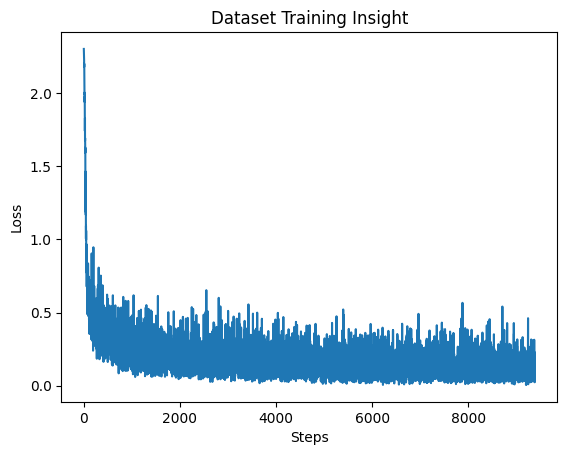

MLP_model(
  (fc1): Linear(in_features=784, out_features=128, bias=True)
  (relu1): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (relu2): ReLU()
  (fc3): Linear(in_features=64, out_features=10, bias=True)
  (Model): Sequential(
    (0): Linear(in_features=784, out_features=128, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Linear(in_features=128, out_features=64, bias=True)
    (4): ReLU()
    (5): Linear(in_features=64, out_features=10, bias=True)
  )
)
Number of paramters: 109386


In [ ]:
train_MLP(lr=0.001, images=images_mnist, labels=labels_mnist, model_instance=instance_mnist(input_size=784,dropout_rate=0.5,hidden_size1=128,hidden_size2=64,num_classes=10), train_Loader=train_loader_mnist, test_Loader=test_loader_mnist)
model_info(input_size=784,dropout_rate=0.5,hidden_size1=128,hidden_size2=64,num_classes=10)

Dropout rate=0.5, H1=128, H2= 64, lr=0.0001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.2782917320728302
Epoch: 5, Step: 638/938, Loss: 0.2590615153312683
Epoch: 5, Step: 639/938, Loss: 0.27067726850509644
Epoch: 5, Step: 640/938, Loss: 0.24544118344783783
Epoch: 5, Step: 641/938, Loss: 0.22197334468364716
Epoch: 5, Step: 642/938, Loss: 0.23868328332901
Epoch: 5, Step: 643/938, Loss: 0.35123440623283386
Epoch: 5, Step: 644/938, Loss: 0.12396757304668427
Epoch: 5, Step: 645/938, Loss: 0.2852013409137726
Epoch: 5, Step: 646/938, Loss: 0.22074651718139648
Epoch: 5, Step: 647/938, Loss: 0.29916560649871826
Epoch: 5, Step: 648/938, Loss: 0.4062384366989136
Epoch: 5, Step: 649/938, Loss: 0.29538679122924805
Epoch: 5, Step: 650/938, Loss: 0.3444894552230835
Epoch: 5, Step: 651/938, Loss: 0.3214681148529053
Epoch: 5, Step: 652/938, Loss: 0.34520670771598816
Epoch: 5, Step: 653/938, Loss: 0.32591748237609863
Epoch: 5, Step: 654/938, Loss: 0.1466871201992035
Epoch: 5, Step: 655/938, Loss: 0.36496600

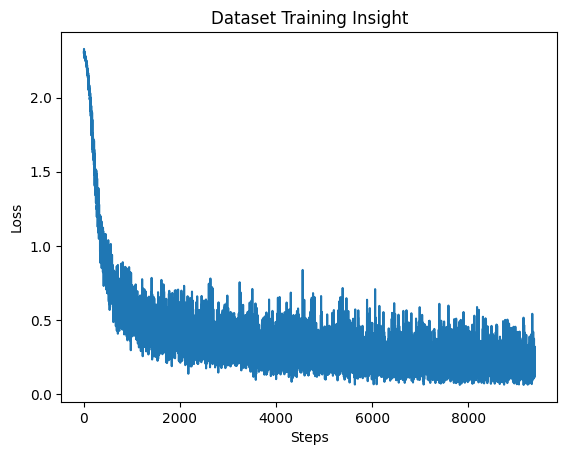

MLP_model(
  (fc1): Linear(in_features=784, out_features=128, bias=True)
  (relu1): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (relu2): ReLU()
  (fc3): Linear(in_features=64, out_features=10, bias=True)
  (Model): Sequential(
    (0): Linear(in_features=784, out_features=128, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Linear(in_features=128, out_features=64, bias=True)
    (4): ReLU()
    (5): Linear(in_features=64, out_features=10, bias=True)
  )
)
Number of paramters: 109386


In [ ]:
train_MLP(lr=0.0001, images=images_mnist, labels=labels_mnist, model_instance=instance_mnist(input_size=784,dropout_rate=0.5,hidden_size1=128,hidden_size2=64,num_classes=10), train_Loader=train_loader_mnist, test_Loader=test_loader_mnist)
model_info(784,0.5,128,64,10)

Dropout rate = 0.3, H1=128, H2=64,  lr=0.001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.13362683355808258
Epoch: 5, Step: 638/938, Loss: 0.022355524823069572
Epoch: 5, Step: 639/938, Loss: 0.14719656109809875
Epoch: 5, Step: 640/938, Loss: 0.12656864523887634
Epoch: 5, Step: 641/938, Loss: 0.0867476612329483
Epoch: 5, Step: 642/938, Loss: 0.09966041147708893
Epoch: 5, Step: 643/938, Loss: 0.07987429201602936
Epoch: 5, Step: 644/938, Loss: 0.11177770793437958
Epoch: 5, Step: 645/938, Loss: 0.08983519673347473
Epoch: 5, Step: 646/938, Loss: 0.08436539024114609
Epoch: 5, Step: 647/938, Loss: 0.07897072285413742
Epoch: 5, Step: 648/938, Loss: 0.233382910490036
Epoch: 5, Step: 649/938, Loss: 0.10474292933940887
Epoch: 5, Step: 650/938, Loss: 0.06633996963500977
Epoch: 5, Step: 651/938, Loss: 0.10532613843679428
Epoch: 5, Step: 652/938, Loss: 0.074400894343853
Epoch: 5, Step: 653/938, Loss: 0.08085642755031586
Epoch: 5, Step: 654/938, Loss: 0.11228469759225845
Epoch: 5, Step: 655/938, Loss: 0.10

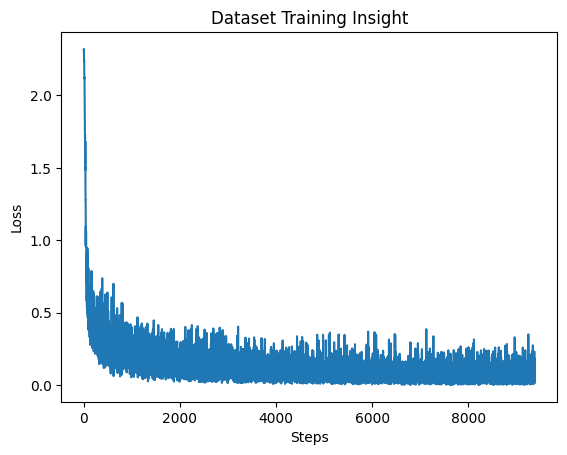

MLP_model(
  (fc1): Linear(in_features=784, out_features=128, bias=True)
  (relu1): ReLU()
  (dropout): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (relu2): ReLU()
  (fc3): Linear(in_features=64, out_features=10, bias=True)
  (Model): Sequential(
    (0): Linear(in_features=784, out_features=128, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=128, out_features=64, bias=True)
    (4): ReLU()
    (5): Linear(in_features=64, out_features=10, bias=True)
  )
)
Number of paramters: 109386


In [ ]:
train_MLP(lr=0.001, images=images_mnist, labels=labels_mnist, model_instance=instance_mnist(input_size=784,dropout_rate=0.3,hidden_size1=128,hidden_size2=64,num_classes=10), train_Loader=train_loader_mnist, test_Loader=test_loader_mnist)
model_info(784,0.3,128,64,10)

Dropout rate = 0.3, H1=128, H2=64,  lr=0.0001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.3301101624965668
Epoch: 5, Step: 638/938, Loss: 0.2956964373588562
Epoch: 5, Step: 639/938, Loss: 0.22605964541435242
Epoch: 5, Step: 640/938, Loss: 0.21634607017040253
Epoch: 5, Step: 641/938, Loss: 0.42557331919670105
Epoch: 5, Step: 642/938, Loss: 0.2740528881549835
Epoch: 5, Step: 643/938, Loss: 0.4065035581588745
Epoch: 5, Step: 644/938, Loss: 0.2855702340602875
Epoch: 5, Step: 645/938, Loss: 0.26213666796684265
Epoch: 5, Step: 646/938, Loss: 0.2485215812921524
Epoch: 5, Step: 647/938, Loss: 0.2611342668533325
Epoch: 5, Step: 648/938, Loss: 0.3027207553386688
Epoch: 5, Step: 649/938, Loss: 0.2624868154525757
Epoch: 5, Step: 650/938, Loss: 0.23418128490447998
Epoch: 5, Step: 651/938, Loss: 0.2996537983417511
Epoch: 5, Step: 652/938, Loss: 0.21922646462917328
Epoch: 5, Step: 653/938, Loss: 0.5334722995758057
Epoch: 5, Step: 654/938, Loss: 0.2298281043767929
Epoch: 5, Step: 655/938, Loss: 0.3592453598

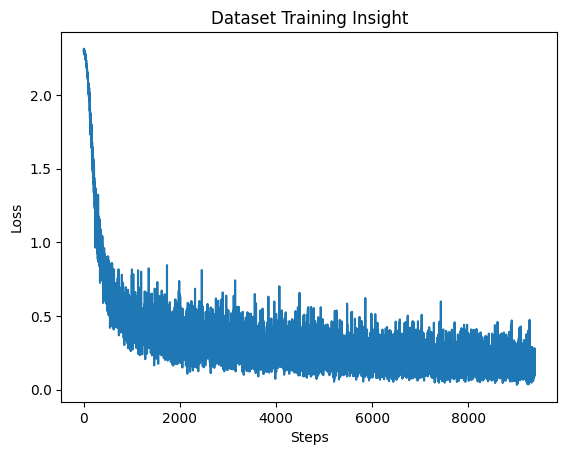

MLP_model(
  (fc1): Linear(in_features=784, out_features=128, bias=True)
  (relu1): ReLU()
  (dropout): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (relu2): ReLU()
  (fc3): Linear(in_features=64, out_features=10, bias=True)
  (Model): Sequential(
    (0): Linear(in_features=784, out_features=128, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=128, out_features=64, bias=True)
    (4): ReLU()
    (5): Linear(in_features=64, out_features=10, bias=True)
  )
)
Number of paramters: 109386


In [ ]:
train_MLP(lr=0.0001, images=images_mnist, labels=labels_mnist, model_instance=instance_mnist(input_size=784,dropout_rate=0.3,hidden_size1=128,hidden_size2=64,num_classes=10), train_Loader=train_loader_mnist, test_Loader=test_loader_mnist)
model_info(784,0.3,128,64,10)

Dropout rate = 0.5, H1=256, H2=128, lr=0.001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.0214243084192276
Epoch: 5, Step: 638/938, Loss: 0.04647424817085266
Epoch: 5, Step: 639/938, Loss: 0.04295700043439865
Epoch: 5, Step: 640/938, Loss: 0.15937700867652893
Epoch: 5, Step: 641/938, Loss: 0.057102639228105545
Epoch: 5, Step: 642/938, Loss: 0.14342352747917175
Epoch: 5, Step: 643/938, Loss: 0.2740398645401001
Epoch: 5, Step: 644/938, Loss: 0.049123406410217285
Epoch: 5, Step: 645/938, Loss: 0.01797466352581978
Epoch: 5, Step: 646/938, Loss: 0.04767889529466629
Epoch: 5, Step: 647/938, Loss: 0.10276196897029877
Epoch: 5, Step: 648/938, Loss: 0.02480209991335869
Epoch: 5, Step: 649/938, Loss: 0.14929762482643127
Epoch: 5, Step: 650/938, Loss: 0.14056378602981567
Epoch: 5, Step: 651/938, Loss: 0.2686604857444763
Epoch: 5, Step: 652/938, Loss: 0.19509431719779968
Epoch: 5, Step: 653/938, Loss: 0.18625690042972565
Epoch: 5, Step: 654/938, Loss: 0.12363628298044205
Epoch: 5, Step: 655/938, Loss: 0

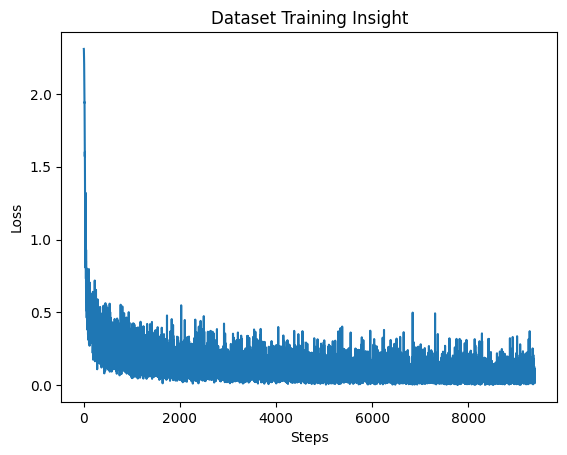

MLP_model(
  (fc1): Linear(in_features=784, out_features=256, bias=True)
  (relu1): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (relu2): ReLU()
  (fc3): Linear(in_features=128, out_features=10, bias=True)
  (Model): Sequential(
    (0): Linear(in_features=784, out_features=256, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Linear(in_features=256, out_features=128, bias=True)
    (4): ReLU()
    (5): Linear(in_features=128, out_features=10, bias=True)
  )
)
Number of paramters: 235146


In [ ]:
train_MLP(lr=0.001, images=images_mnist, labels=labels_mnist, model_instance=instance_mnist(input_size=784,dropout_rate=0.5,hidden_size1=256,hidden_size2=128,num_classes=10), train_Loader=train_loader_mnist, test_Loader=test_loader_mnist)
model_info(784,0.5,256,128,10)

Dropout rate=0.5, H1=256, H2=128, lr=0.0001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.3780049979686737
Epoch: 5, Step: 638/938, Loss: 0.1734429895877838
Epoch: 5, Step: 639/938, Loss: 0.1921014040708542
Epoch: 5, Step: 640/938, Loss: 0.2634379267692566
Epoch: 5, Step: 641/938, Loss: 0.2655421495437622
Epoch: 5, Step: 642/938, Loss: 0.2628493010997772
Epoch: 5, Step: 643/938, Loss: 0.2450578361749649
Epoch: 5, Step: 644/938, Loss: 0.10974609851837158
Epoch: 5, Step: 645/938, Loss: 0.12856566905975342
Epoch: 5, Step: 646/938, Loss: 0.12804661691188812
Epoch: 5, Step: 647/938, Loss: 0.18943828344345093
Epoch: 5, Step: 648/938, Loss: 0.2575705647468567
Epoch: 5, Step: 649/938, Loss: 0.26665782928466797
Epoch: 5, Step: 650/938, Loss: 0.2603611648082733
Epoch: 5, Step: 651/938, Loss: 0.16505564749240875
Epoch: 5, Step: 652/938, Loss: 0.289141446352005
Epoch: 5, Step: 653/938, Loss: 0.23957982659339905
Epoch: 5, Step: 654/938, Loss: 0.2497646063566208
Epoch: 5, Step: 655/938, Loss: 0.2951703667

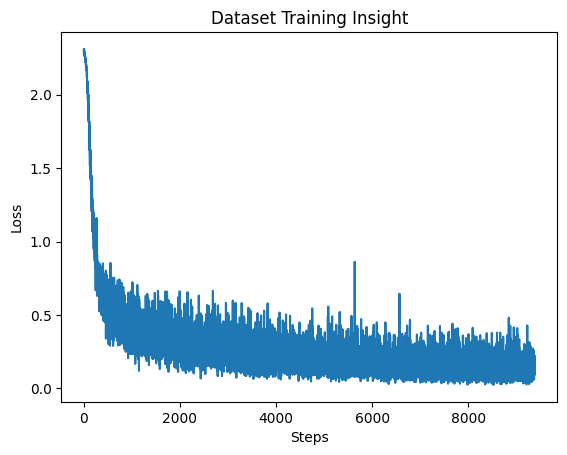

MLP_model(
  (fc1): Linear(in_features=784, out_features=256, bias=True)
  (relu1): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (relu2): ReLU()
  (fc3): Linear(in_features=128, out_features=10, bias=True)
  (Model): Sequential(
    (0): Linear(in_features=784, out_features=256, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Linear(in_features=256, out_features=128, bias=True)
    (4): ReLU()
    (5): Linear(in_features=128, out_features=10, bias=True)
  )
)
Number of paramters: 235146


In [ ]:
train_MLP(lr=0.0001, images=images_mnist, labels=labels_mnist, model_instance=instance_mnist(input_size=784,dropout_rate=0.5,hidden_size1=256,hidden_size2=128,num_classes=10), train_Loader=train_loader_mnist, test_Loader=test_loader_mnist)
model_info(784,0.5,256,128,10)

Dropout rate = 0.3, H1=256, H2=128, lr=0.001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.022659171372652054
Epoch: 5, Step: 638/938, Loss: 0.023051651194691658
Epoch: 5, Step: 639/938, Loss: 0.04777145758271217
Epoch: 5, Step: 640/938, Loss: 0.08150158077478409
Epoch: 5, Step: 641/938, Loss: 0.08794624358415604
Epoch: 5, Step: 642/938, Loss: 0.07996203750371933
Epoch: 5, Step: 643/938, Loss: 0.09926148504018784
Epoch: 5, Step: 644/938, Loss: 0.05387157201766968
Epoch: 5, Step: 645/938, Loss: 0.03977833315730095
Epoch: 5, Step: 646/938, Loss: 0.013240044936537743
Epoch: 5, Step: 647/938, Loss: 0.059089064598083496
Epoch: 5, Step: 648/938, Loss: 0.05639554187655449
Epoch: 5, Step: 649/938, Loss: 0.0637241080403328
Epoch: 5, Step: 650/938, Loss: 0.060025207698345184
Epoch: 5, Step: 651/938, Loss: 0.0824878066778183
Epoch: 5, Step: 652/938, Loss: 0.04097535088658333
Epoch: 5, Step: 653/938, Loss: 0.08584554493427277
Epoch: 5, Step: 654/938, Loss: 0.07834181189537048
Epoch: 5, Step: 655/938, Los

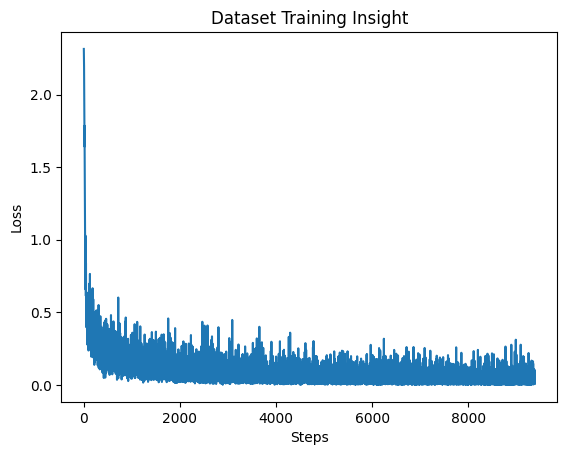

MLP_model(
  (fc1): Linear(in_features=784, out_features=256, bias=True)
  (relu1): ReLU()
  (dropout): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (relu2): ReLU()
  (fc3): Linear(in_features=128, out_features=10, bias=True)
  (Model): Sequential(
    (0): Linear(in_features=784, out_features=256, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=256, out_features=128, bias=True)
    (4): ReLU()
    (5): Linear(in_features=128, out_features=10, bias=True)
  )
)
Number of paramters: 235146


In [ ]:
train_MLP(lr=0.001, images=images_mnist, labels=labels_mnist, model_instance=instance_mnist(input_size=784,dropout_rate=0.3,hidden_size1=256,hidden_size2=128,num_classes=10), train_Loader=train_loader_mnist, test_Loader=test_loader_mnist)
model_info(784,0.3,256,128,10)

Dropout rate = 0.3, H1=256, H2=128, lr=0.0001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.13308724761009216
Epoch: 5, Step: 638/938, Loss: 0.21869482100009918
Epoch: 5, Step: 639/938, Loss: 0.2149219959974289
Epoch: 5, Step: 640/938, Loss: 0.14897799491882324
Epoch: 5, Step: 641/938, Loss: 0.13811971247196198
Epoch: 5, Step: 642/938, Loss: 0.12739095091819763
Epoch: 5, Step: 643/938, Loss: 0.19691202044487
Epoch: 5, Step: 644/938, Loss: 0.21734900772571564
Epoch: 5, Step: 645/938, Loss: 0.2083919495344162
Epoch: 5, Step: 646/938, Loss: 0.3646309971809387
Epoch: 5, Step: 647/938, Loss: 0.11139444261789322
Epoch: 5, Step: 648/938, Loss: 0.33191171288490295
Epoch: 5, Step: 649/938, Loss: 0.13748444616794586
Epoch: 5, Step: 650/938, Loss: 0.20324887335300446
Epoch: 5, Step: 651/938, Loss: 0.2770991027355194
Epoch: 5, Step: 652/938, Loss: 0.15999482572078705
Epoch: 5, Step: 653/938, Loss: 0.09938175976276398
Epoch: 5, Step: 654/938, Loss: 0.2066047638654709
Epoch: 5, Step: 655/938, Loss: 0.067254

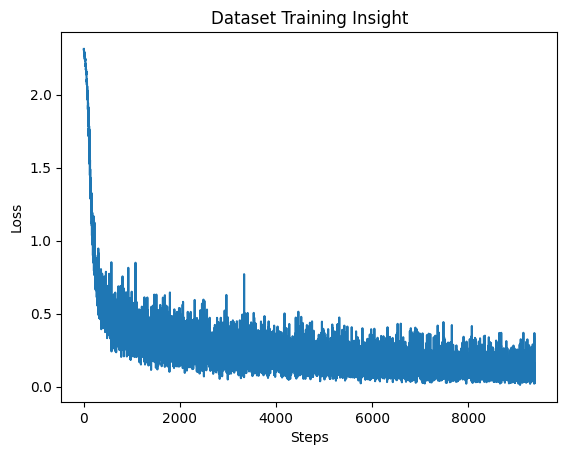

MLP_model(
  (fc1): Linear(in_features=784, out_features=256, bias=True)
  (relu1): ReLU()
  (dropout): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (relu2): ReLU()
  (fc3): Linear(in_features=128, out_features=10, bias=True)
  (Model): Sequential(
    (0): Linear(in_features=784, out_features=256, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=256, out_features=128, bias=True)
    (4): ReLU()
    (5): Linear(in_features=128, out_features=10, bias=True)
  )
)
Number of paramters: 235146


In [ ]:
train_MLP(lr=0.0001, images=images_mnist, labels=labels_mnist, model_instance=instance_mnist(input_size=784,dropout_rate=0.3,hidden_size1=256,hidden_size2=128,num_classes=10), train_Loader=train_loader_mnist, test_Loader=test_loader_mnist)
model_info(784,0.3,256,128,10)

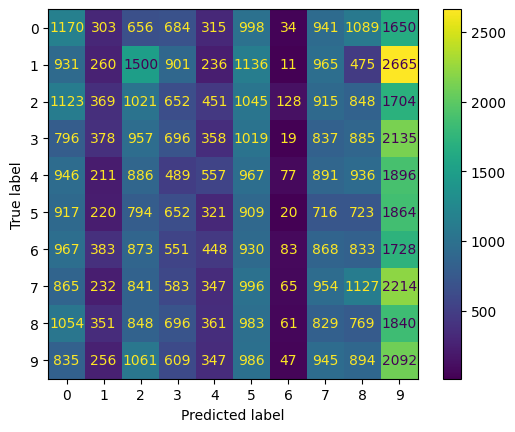

In [ ]:
import torch
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
all_models = []
all_models.append({'model': instance_mnist(input_size=784, dropout_rate=0.5, hidden_size1=128, hidden_size2=64, num_classes=10), 'lr': 0.001})
all_models.append({'model': instance_mnist(input_size=784, dropout_rate=0.5, hidden_size1=128, hidden_size2=64, num_classes=10), 'lr': 0.0001})
all_models.append({'model': instance_mnist(input_size=784, dropout_rate=0.3, hidden_size1=128, hidden_size2=64, num_classes=10), 'lr': 0.001})
all_models.append({'model': instance_mnist(input_size=784, dropout_rate=0.3, hidden_size1=128, hidden_size2=64, num_classes=10), 'lr': 0.0001})
all_models.append({'model': instance_mnist(input_size=784, dropout_rate=0.5, hidden_size1=256, hidden_size2=128, num_classes=10), 'lr': 0.001})
all_models.append({'model': instance_mnist(input_size=784, dropout_rate=0.5, hidden_size1=256, hidden_size2=128, num_classes=10), 'lr': 0.0001})
all_models.append({'model': instance_mnist(input_size=784, dropout_rate=0.3, hidden_size1=256, hidden_size2=128, num_classes=10), 'lr': 0.001})
all_models.append({'model': instance_mnist(input_size=784, dropout_rate=0.3, hidden_size1=256, hidden_size2=128, num_classes=10), 'lr': 0.0001})

correct_labels = []
predicted_labels = []

with torch.no_grad():
    for item in all_models:
        model = item['model']
        lr = item['lr']
        for images, labels in test_loader_mnist:
            images = images.view(-1, 784)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            correct_labels.extend(labels.numpy())
            predicted_labels.extend(predicted.numpy())
cm = confusion_matrix(correct_labels, predicted_labels)
ConfusionMatrixDisplay(cm).plot()
plt.show()


#2)FashionMNIST dataset

Dropout rate=0.5, H1=128, H2=64, lr=0.001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.3998033106327057
Epoch: 5, Step: 638/938, Loss: 0.49460962414741516
Epoch: 5, Step: 639/938, Loss: 0.4048722982406616
Epoch: 5, Step: 640/938, Loss: 0.37903204560279846
Epoch: 5, Step: 641/938, Loss: 0.5702711343765259
Epoch: 5, Step: 642/938, Loss: 0.23362042009830475
Epoch: 5, Step: 643/938, Loss: 0.45597249269485474
Epoch: 5, Step: 644/938, Loss: 0.32791662216186523
Epoch: 5, Step: 645/938, Loss: 0.4218102991580963
Epoch: 5, Step: 646/938, Loss: 0.3428120017051697
Epoch: 5, Step: 647/938, Loss: 0.39970630407333374
Epoch: 5, Step: 648/938, Loss: 0.510532557964325
Epoch: 5, Step: 649/938, Loss: 0.3244788944721222
Epoch: 5, Step: 650/938, Loss: 0.4224730432033539
Epoch: 5, Step: 651/938, Loss: 0.25834596157073975
Epoch: 5, Step: 652/938, Loss: 0.41217365860939026
Epoch: 5, Step: 653/938, Loss: 0.23030300438404083
Epoch: 5, Step: 654/938, Loss: 0.5451868176460266
Epoch: 5, Step: 655/938, Loss: 0.39784848

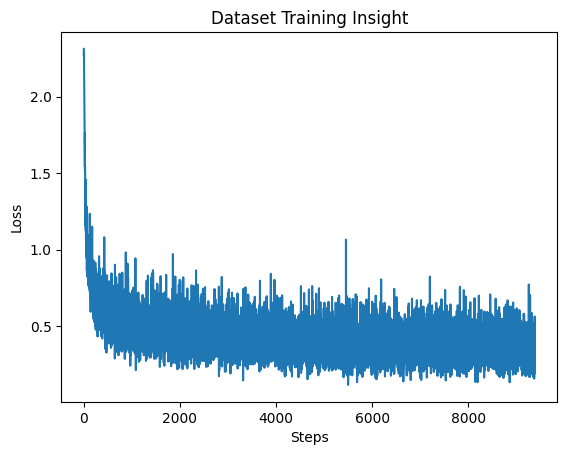

MLP_model(
  (fc1): Linear(in_features=784, out_features=128, bias=True)
  (relu1): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (relu2): ReLU()
  (fc3): Linear(in_features=64, out_features=10, bias=True)
  (Model): Sequential(
    (0): Linear(in_features=784, out_features=128, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Linear(in_features=128, out_features=64, bias=True)
    (4): ReLU()
    (5): Linear(in_features=64, out_features=10, bias=True)
  )
)
Number of paramters: 109386


In [ ]:
train_MLP(lr=0.001, images=images_fashion, labels=labels_fashion, model_instance=instance_fashion(input_size=784,dropout_rate=0.5,hidden_size1=128,hidden_size2=64,num_classes=10), train_Loader=train_loader_fashion, test_Loader=test_loader_fashion)
model_info(input_size=784,dropout_rate=0.5,hidden_size1=128,hidden_size2=64,num_classes=10)

Dropout rate = 0.5, H1=128, H2=64 , lr=0.0001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.6017871499061584
Epoch: 5, Step: 638/938, Loss: 0.404211163520813
Epoch: 5, Step: 639/938, Loss: 0.4899739921092987
Epoch: 5, Step: 640/938, Loss: 0.3636382818222046
Epoch: 5, Step: 641/938, Loss: 0.49367547035217285
Epoch: 5, Step: 642/938, Loss: 0.5823704600334167
Epoch: 5, Step: 643/938, Loss: 0.5112755298614502
Epoch: 5, Step: 644/938, Loss: 0.5723632574081421
Epoch: 5, Step: 645/938, Loss: 0.7353377342224121
Epoch: 5, Step: 646/938, Loss: 0.35164278745651245
Epoch: 5, Step: 647/938, Loss: 0.6892756819725037
Epoch: 5, Step: 648/938, Loss: 0.5462715029716492
Epoch: 5, Step: 649/938, Loss: 0.5199885368347168
Epoch: 5, Step: 650/938, Loss: 0.5838266611099243
Epoch: 5, Step: 651/938, Loss: 0.5732855796813965
Epoch: 5, Step: 652/938, Loss: 0.48853251338005066
Epoch: 5, Step: 653/938, Loss: 0.3475339114665985
Epoch: 5, Step: 654/938, Loss: 0.4893108308315277
Epoch: 5, Step: 655/938, Loss: 0.55754476785659

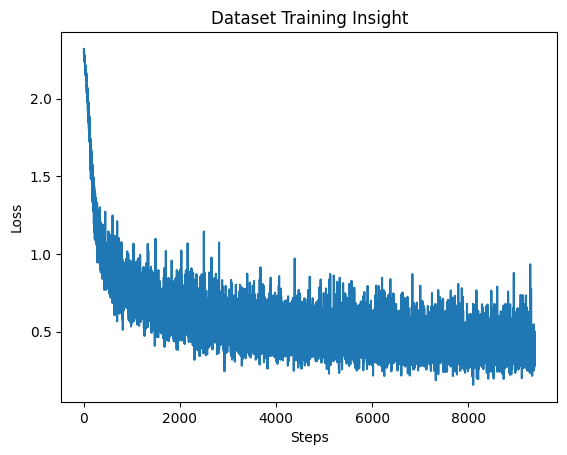

MLP_model(
  (fc1): Linear(in_features=784, out_features=128, bias=True)
  (relu1): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (relu2): ReLU()
  (fc3): Linear(in_features=64, out_features=10, bias=True)
  (Model): Sequential(
    (0): Linear(in_features=784, out_features=128, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Linear(in_features=128, out_features=64, bias=True)
    (4): ReLU()
    (5): Linear(in_features=64, out_features=10, bias=True)
  )
)
Number of paramters: 109386


In [ ]:
train_MLP(lr=0.0001, images=images_fashion, labels=labels_fashion, model_instance=instance_fashion(input_size=784,dropout_rate=0.5,hidden_size1=128,hidden_size2=64,num_classes=10), train_Loader=train_loader_fashion, test_Loader=test_loader_fashion)
model_info(784,0.5,128,64,10)

Dropout rate=0.3, H1=128, H2=64, lr=0.001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.2500554919242859
Epoch: 5, Step: 638/938, Loss: 0.3746015429496765
Epoch: 5, Step: 639/938, Loss: 0.6558921337127686
Epoch: 5, Step: 640/938, Loss: 0.32157811522483826
Epoch: 5, Step: 641/938, Loss: 0.27928194403648376
Epoch: 5, Step: 642/938, Loss: 0.31517431139945984
Epoch: 5, Step: 643/938, Loss: 0.32297614216804504
Epoch: 5, Step: 644/938, Loss: 0.25087782740592957
Epoch: 5, Step: 645/938, Loss: 0.24697621166706085
Epoch: 5, Step: 646/938, Loss: 0.4958753287792206
Epoch: 5, Step: 647/938, Loss: 0.2587090730667114
Epoch: 5, Step: 648/938, Loss: 0.4455307126045227
Epoch: 5, Step: 649/938, Loss: 0.41147974133491516
Epoch: 5, Step: 650/938, Loss: 0.28637781739234924
Epoch: 5, Step: 651/938, Loss: 0.3370286822319031
Epoch: 5, Step: 652/938, Loss: 0.33106058835983276
Epoch: 5, Step: 653/938, Loss: 0.2822451591491699
Epoch: 5, Step: 654/938, Loss: 0.3616449534893036
Epoch: 5, Step: 655/938, Loss: 0.3246458

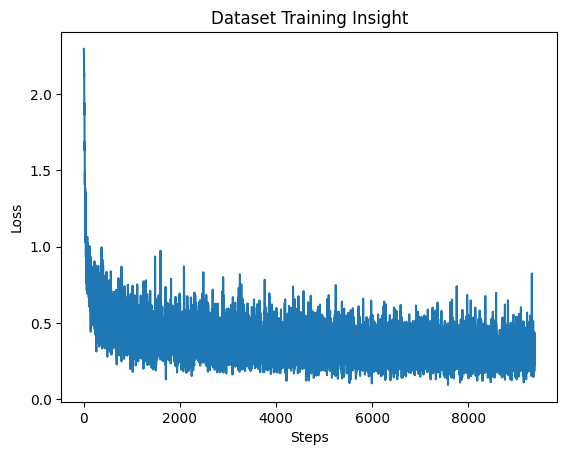

MLP_model(
  (fc1): Linear(in_features=784, out_features=128, bias=True)
  (relu1): ReLU()
  (dropout): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (relu2): ReLU()
  (fc3): Linear(in_features=64, out_features=10, bias=True)
  (Model): Sequential(
    (0): Linear(in_features=784, out_features=128, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=128, out_features=64, bias=True)
    (4): ReLU()
    (5): Linear(in_features=64, out_features=10, bias=True)
  )
)
Number of paramters: 109386


In [ ]:
train_MLP(lr=0.001, images=images_fashion, labels=labels_fashion, model_instance=instance_fashion(input_size=784,dropout_rate=0.3,hidden_size1=128,hidden_size2=64,num_classes=10), train_Loader=train_loader_fashion, test_Loader=test_loader_fashion)
model_info(784,0.3,128,64,10)

Dropout rate=0.3, H1=128, H2=64, lr=0.0001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.4677666127681732
Epoch: 5, Step: 638/938, Loss: 0.42811155319213867
Epoch: 5, Step: 639/938, Loss: 0.4378630518913269
Epoch: 5, Step: 640/938, Loss: 0.32594990730285645
Epoch: 5, Step: 641/938, Loss: 0.4457348883152008
Epoch: 5, Step: 642/938, Loss: 0.4237619638442993
Epoch: 5, Step: 643/938, Loss: 0.3990786373615265
Epoch: 5, Step: 644/938, Loss: 0.2774997353553772
Epoch: 5, Step: 645/938, Loss: 0.3767606019973755
Epoch: 5, Step: 646/938, Loss: 0.48739829659461975
Epoch: 5, Step: 647/938, Loss: 0.5107942819595337
Epoch: 5, Step: 648/938, Loss: 0.49675634503364563
Epoch: 5, Step: 649/938, Loss: 0.49438971281051636
Epoch: 5, Step: 650/938, Loss: 0.3401128351688385
Epoch: 5, Step: 651/938, Loss: 0.40742358565330505
Epoch: 5, Step: 652/938, Loss: 0.39931678771972656
Epoch: 5, Step: 653/938, Loss: 0.2898176908493042
Epoch: 5, Step: 654/938, Loss: 0.3735220432281494
Epoch: 5, Step: 655/938, Loss: 0.472640454

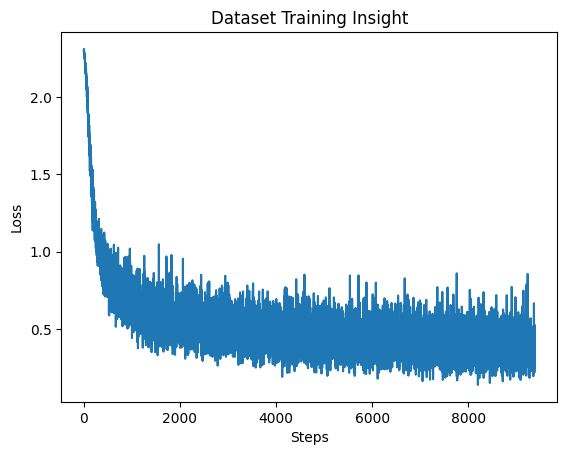

MLP_model(
  (fc1): Linear(in_features=784, out_features=128, bias=True)
  (relu1): ReLU()
  (dropout): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (relu2): ReLU()
  (fc3): Linear(in_features=64, out_features=10, bias=True)
  (Model): Sequential(
    (0): Linear(in_features=784, out_features=128, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=128, out_features=64, bias=True)
    (4): ReLU()
    (5): Linear(in_features=64, out_features=10, bias=True)
  )
)
Number of paramters: 109386


In [ ]:
train_MLP(lr=0.0001, images=images_fashion, labels=labels_fashion, model_instance=instance_fashion(input_size=784,dropout_rate=0.3,hidden_size1=128,hidden_size2=64,num_classes=10), train_Loader=train_loader_fashion, test_Loader=test_loader_fashion)
model_info(784,0.3,128,64,10)

Dropout rate=0.5, H1=256, H2=128, lr=0.001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.3807533085346222
Epoch: 5, Step: 638/938, Loss: 0.2893252968788147
Epoch: 5, Step: 639/938, Loss: 0.4832625091075897
Epoch: 5, Step: 640/938, Loss: 0.33848679065704346
Epoch: 5, Step: 641/938, Loss: 0.31050974130630493
Epoch: 5, Step: 642/938, Loss: 0.32460349798202515
Epoch: 5, Step: 643/938, Loss: 0.311855286359787
Epoch: 5, Step: 644/938, Loss: 0.36400431394577026
Epoch: 5, Step: 645/938, Loss: 0.6494850516319275
Epoch: 5, Step: 646/938, Loss: 0.3227068781852722
Epoch: 5, Step: 647/938, Loss: 0.26833686232566833
Epoch: 5, Step: 648/938, Loss: 0.2963748574256897
Epoch: 5, Step: 649/938, Loss: 0.48582836985588074
Epoch: 5, Step: 650/938, Loss: 0.4642157256603241
Epoch: 5, Step: 651/938, Loss: 0.3741052746772766
Epoch: 5, Step: 652/938, Loss: 0.6266812086105347
Epoch: 5, Step: 653/938, Loss: 0.2557966411113739
Epoch: 5, Step: 654/938, Loss: 0.30142295360565186
Epoch: 5, Step: 655/938, Loss: 0.3894348740

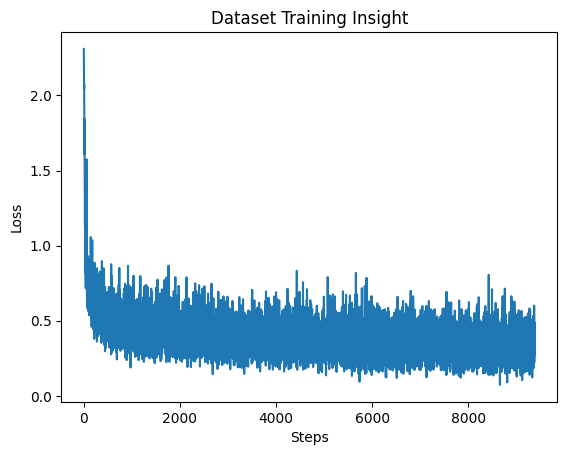

MLP_model(
  (fc1): Linear(in_features=784, out_features=256, bias=True)
  (relu1): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (relu2): ReLU()
  (fc3): Linear(in_features=128, out_features=10, bias=True)
  (Model): Sequential(
    (0): Linear(in_features=784, out_features=256, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Linear(in_features=256, out_features=128, bias=True)
    (4): ReLU()
    (5): Linear(in_features=128, out_features=10, bias=True)
  )
)
Number of paramters: 235146


In [ ]:
train_MLP(lr=0.001, images=images_fashion, labels=labels_fashion, model_instance=instance_fashion(input_size=784,dropout_rate=0.5,hidden_size1=256,hidden_size2=128,num_classes=10), train_Loader=train_loader_fashion, test_Loader=test_loader_fashion)
model_info(784,0.5,256,128,10)

Dropout rate=0.5, H1=256, H2=128, lr=0.0001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.47227081656455994
Epoch: 5, Step: 638/938, Loss: 0.2981162667274475
Epoch: 5, Step: 639/938, Loss: 0.5513915419578552
Epoch: 5, Step: 640/938, Loss: 0.40478721261024475
Epoch: 5, Step: 641/938, Loss: 0.4042212665081024
Epoch: 5, Step: 642/938, Loss: 0.4724891483783722
Epoch: 5, Step: 643/938, Loss: 0.6226534843444824
Epoch: 5, Step: 644/938, Loss: 0.36696720123291016
Epoch: 5, Step: 645/938, Loss: 0.486333966255188
Epoch: 5, Step: 646/938, Loss: 0.4202163517475128
Epoch: 5, Step: 647/938, Loss: 0.5221757888793945
Epoch: 5, Step: 648/938, Loss: 0.4422418177127838
Epoch: 5, Step: 649/938, Loss: 0.27784478664398193
Epoch: 5, Step: 650/938, Loss: 0.5819739103317261
Epoch: 5, Step: 651/938, Loss: 0.5208849906921387
Epoch: 5, Step: 652/938, Loss: 0.5360654592514038
Epoch: 5, Step: 653/938, Loss: 0.5349443554878235
Epoch: 5, Step: 654/938, Loss: 0.5066890120506287
Epoch: 5, Step: 655/938, Loss: 0.4624817669391

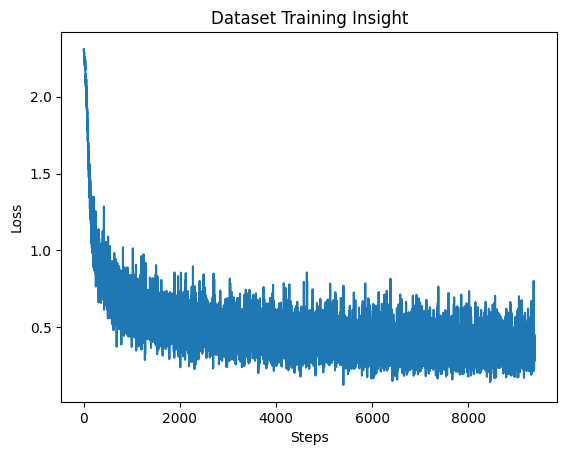

MLP_model(
  (fc1): Linear(in_features=784, out_features=256, bias=True)
  (relu1): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (relu2): ReLU()
  (fc3): Linear(in_features=128, out_features=10, bias=True)
  (Model): Sequential(
    (0): Linear(in_features=784, out_features=256, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Linear(in_features=256, out_features=128, bias=True)
    (4): ReLU()
    (5): Linear(in_features=128, out_features=10, bias=True)
  )
)
Number of paramters: 235146


In [ ]:
train_MLP(lr=0.0001, images=images_fashion, labels=labels_fashion, model_instance=instance_fashion(input_size=784,dropout_rate=0.5,hidden_size1=256,hidden_size2=128,num_classes=10), train_Loader=train_loader_fashion, test_Loader=test_loader_fashion)
model_info(784,0.5,256,128,10)

Dropout rate=0.3, H1=256, H2=128, lr=0.001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.38436567783355713
Epoch: 5, Step: 638/938, Loss: 0.2761338949203491
Epoch: 5, Step: 639/938, Loss: 0.32493239641189575
Epoch: 5, Step: 640/938, Loss: 0.2691836953163147
Epoch: 5, Step: 641/938, Loss: 0.311998575925827
Epoch: 5, Step: 642/938, Loss: 0.3251841366291046
Epoch: 5, Step: 643/938, Loss: 0.30328357219696045
Epoch: 5, Step: 644/938, Loss: 0.27223438024520874
Epoch: 5, Step: 645/938, Loss: 0.313122034072876
Epoch: 5, Step: 646/938, Loss: 0.286374568939209
Epoch: 5, Step: 647/938, Loss: 0.36829984188079834
Epoch: 5, Step: 648/938, Loss: 0.2909904718399048
Epoch: 5, Step: 649/938, Loss: 0.3933922052383423
Epoch: 5, Step: 650/938, Loss: 0.21898594498634338
Epoch: 5, Step: 651/938, Loss: 0.40435242652893066
Epoch: 5, Step: 652/938, Loss: 0.4044288098812103
Epoch: 5, Step: 653/938, Loss: 0.3189339339733124
Epoch: 5, Step: 654/938, Loss: 0.4291096329689026
Epoch: 5, Step: 655/938, Loss: 0.347904503345

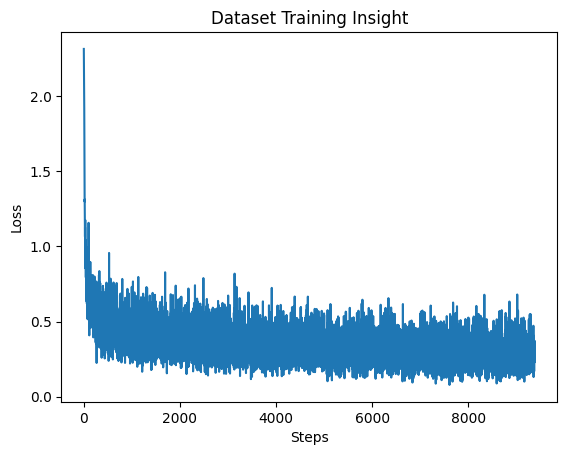

MLP_model(
  (fc1): Linear(in_features=784, out_features=256, bias=True)
  (relu1): ReLU()
  (dropout): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (relu2): ReLU()
  (fc3): Linear(in_features=128, out_features=10, bias=True)
  (Model): Sequential(
    (0): Linear(in_features=784, out_features=256, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=256, out_features=128, bias=True)
    (4): ReLU()
    (5): Linear(in_features=128, out_features=10, bias=True)
  )
)
Number of paramters: 235146


In [ ]:
train_MLP(lr=0.001, images=images_fashion, labels=labels_fashion, model_instance=instance_fashion(input_size=784,dropout_rate=0.3,hidden_size1=256,hidden_size2=128,num_classes=10), train_Loader=train_loader_fashion, test_Loader=test_loader_fashion)
model_info(784,0.3,256,128,10)

Dropout rate=0.3, H1=256, H2=128, lr=0.0001

Streaming output truncated to the last 5000 lines.
Epoch: 5, Step: 637/938, Loss: 0.44868069887161255
Epoch: 5, Step: 638/938, Loss: 0.4545748233795166
Epoch: 5, Step: 639/938, Loss: 0.32912519574165344
Epoch: 5, Step: 640/938, Loss: 0.4317905902862549
Epoch: 5, Step: 641/938, Loss: 0.3947150409221649
Epoch: 5, Step: 642/938, Loss: 0.46626153588294983
Epoch: 5, Step: 643/938, Loss: 0.2764297425746918
Epoch: 5, Step: 644/938, Loss: 0.43409109115600586
Epoch: 5, Step: 645/938, Loss: 0.3809695243835449
Epoch: 5, Step: 646/938, Loss: 0.4041837453842163
Epoch: 5, Step: 647/938, Loss: 0.3269270658493042
Epoch: 5, Step: 648/938, Loss: 0.3433913588523865
Epoch: 5, Step: 649/938, Loss: 0.43653520941734314
Epoch: 5, Step: 650/938, Loss: 0.49936971068382263
Epoch: 5, Step: 651/938, Loss: 0.3711482882499695
Epoch: 5, Step: 652/938, Loss: 0.3457302749156952
Epoch: 5, Step: 653/938, Loss: 0.48124057054519653
Epoch: 5, Step: 654/938, Loss: 0.4471679925918579
Epoch: 5, Step: 655/938, Loss: 0.612104177

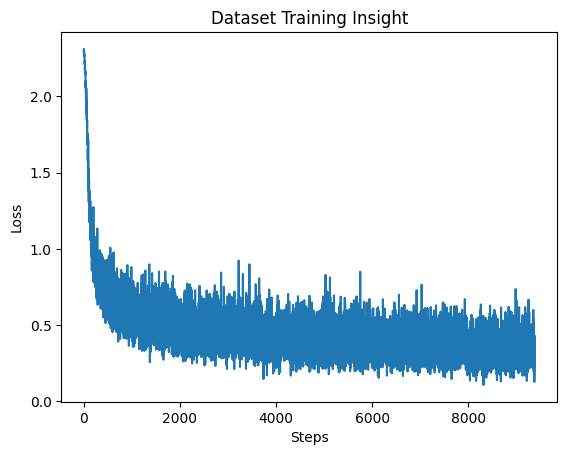

MLP_model(
  (fc1): Linear(in_features=784, out_features=256, bias=True)
  (relu1): ReLU()
  (dropout): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (relu2): ReLU()
  (fc3): Linear(in_features=128, out_features=10, bias=True)
  (Model): Sequential(
    (0): Linear(in_features=784, out_features=256, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=256, out_features=128, bias=True)
    (4): ReLU()
    (5): Linear(in_features=128, out_features=10, bias=True)
  )
)
Number of paramters: 235146


In [ ]:
train_MLP(lr=0.0001, images=images_fashion, labels=labels_fashion, model_instance=instance_fashion(input_size=784,dropout_rate=0.3,hidden_size1=256,hidden_size2=128,num_classes=10), train_Loader=train_loader_fashion, test_Loader=test_loader_fashion)
model_info(784,0.3,256,128,10)

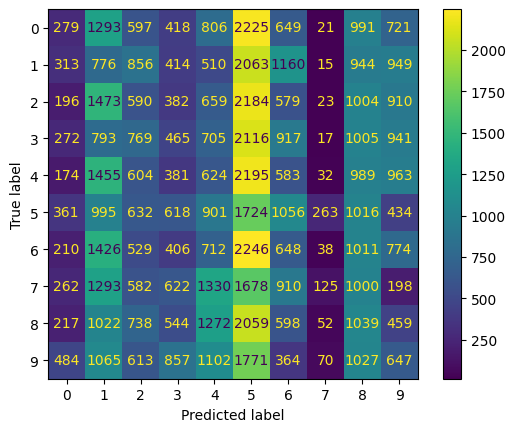

In [ ]:
import torch
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
all_models = []
all_models.append({'model': instance_fashion(input_size=784, dropout_rate=0.5, hidden_size1=128, hidden_size2=64, num_classes=10), 'lr': 0.001})
all_models.append({'model': instance_fashion(input_size=784, dropout_rate=0.5, hidden_size1=128, hidden_size2=64, num_classes=10), 'lr': 0.0001})
all_models.append({'model': instance_fashion(input_size=784, dropout_rate=0.3, hidden_size1=128, hidden_size2=64, num_classes=10), 'lr': 0.001})
all_models.append({'model': instance_fashion(input_size=784, dropout_rate=0.3, hidden_size1=128, hidden_size2=64, num_classes=10), 'lr': 0.0001})
all_models.append({'model': instance_fashion(input_size=784, dropout_rate=0.5, hidden_size1=256, hidden_size2=128, num_classes=10), 'lr': 0.001})
all_models.append({'model': instance_fashion(input_size=784, dropout_rate=0.5, hidden_size1=256, hidden_size2=128, num_classes=10), 'lr': 0.0001})
all_models.append({'model': instance_fashion(input_size=784, dropout_rate=0.3, hidden_size1=256, hidden_size2=128, num_classes=10), 'lr': 0.001})
all_models.append({'model': instance_fashion(input_size=784, dropout_rate=0.3, hidden_size1=256, hidden_size2=128, num_classes=10), 'lr': 0.0001})

correct_labels = []
predicted_labels = []
with torch.no_grad():
    for item in all_models:
        model = item['model']
        lr = item['lr']
        for images, labels in test_loader_fashion:
            images = images.view(-1, 784)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            correct_labels.extend(labels.numpy())
            predicted_labels.extend(predicted.numpy())

cm = confusion_matrix(correct_labels, predicted_labels)
ConfusionMatrixDisplay(cm).plot()
plt.show()


#**ANALYSIS AND COMPARISON OF BOTH MODELS(CNN AND MLP)**


  The project aimed at image classification of the MNIST and FashionMNIST datasets has brought out effective results which are quite satisfactory. The models have performed quite well on both datsets, having provided more accurate predictions for the MNIST dataset with 10 classes over the FashionMNIST dataset also with 10 classes. There were a few misclassifications observed for the datasets which the models had predicted wrongly. The performance metrics for the models have been evaluated using confusion matrices as above and here are some of the insights obtained for the two models:

1. CNN Model (MNIST dataset):


  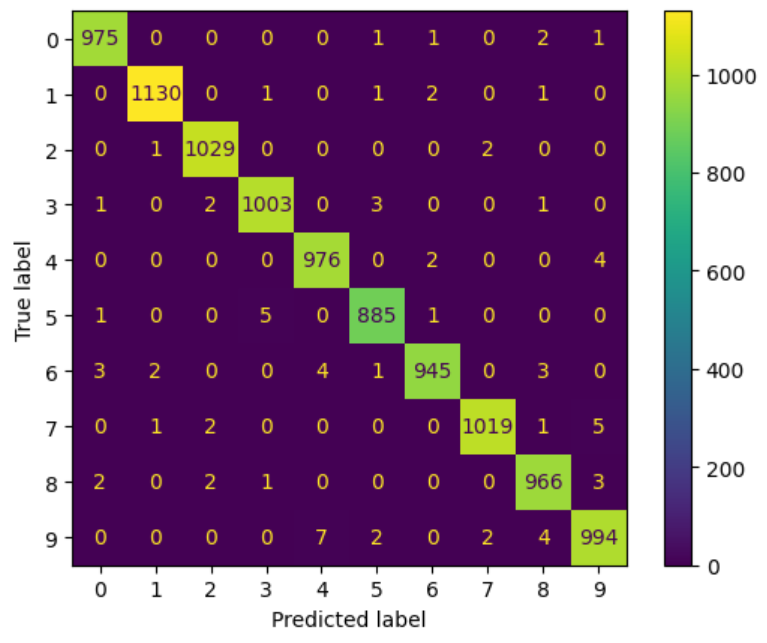



   The CNN model has provided satisfactory results for the image classification problem of the MNIST dataset. The model has accurately predicted most of the classes with following observations:
   1. Correct Classifications: The correct classifications lie along the diagonal of the matrix with following numbers->

   * Class 0: 975
   * Class 1: 1130
   * Class 2: 1029
   * Class 3: 1003
   * Class 4: 976
   * Class 5: 885
   * Class 6: 945
   * Class 7: 1019
   * Class 8: 966
   * Class 9: 994
   
   2. Misclassifications: The misclassifications in the model are as follows->
   * Some notable misclassifications:

    a. Class 5 is misclassified as class 3 for 5 samples.

    b. Class 3 is misclassified as class 5 for 5 samples.

    c. Class 9 is misclassified as class 4 for 7 samples.

* General Observations:

    a. The model performs well overall with high true
    positive rates for most classes.

    b. The classes 5 and 3 show a noticeable pattern of misclassification with each other, indicating possible similarities in features that the model finds hard to distinguish.

    c. The classes 1, 2, 4, and 7 have particularly high correct prediction counts, indicating that the model performs quite well for these classes.

  ## EFFECT OF HYPERPARAMETERS

  1. Learning Rate: On changing learning rate from 0.001 to 0.0001, the model's accuracy and performance improved by slight margins, owing to a better or optimum progress of gradients.

  2. Filter Size: On doubling the filter size from 32 to 64 , the accuracies remained  almost same for the latter too but the accuracies went on improving consistently for the former.


2. CNN Model (FashionMNIST dataset):
  
  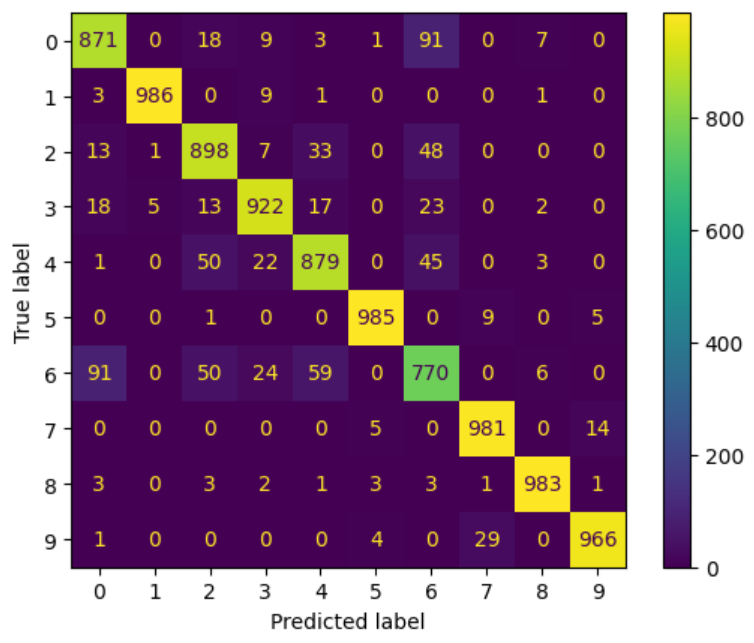



  The CNN model has provided  near satisfactory results for the image classification problem of the FashionMNIST dataset. The model has almost predicted most of the classes with following observations:
   1. Correct Classifications: The correct classifications lie along the diagonal of the matrix with following numbers->

   * Class 0: 871
   * Class 1: 986
   * Class 2: 898
   * Class 3: 922
   * Class 4: 879
   * Class 5: 985
   * Class 6: 770
   * Class 7: 981
   * Class 8: 983
   * Class 9: 966

   
2. Misclassifications:
  The misclassifications in the model are as follows->
    * Some notable misclassifications:

   a. Class 0 and Class 6: Significant confusion, with Class 0 misclassified as Class 6 (91 samples) and vice versa.

   b. Class 6: Has the highest misclassification rate, being confused with Class 0 (91 samples), Class 3 (59 samples), and Class 4 (24 samples).

   c. Class 4 and Class 3: Significant mutual misclassification, with Class 4 misclassified as Class 3 (50 samples).

* General Observations:

  a. Class 6 shows the highest number of misclassifications, particularly with classes 0 and 3, indicating a potential feature overlap or similarity that the model struggles to distinguish.

  b. Classes 1, 5, 7, 8, and 9 exhibit high accuracy with minimal misclassifications.

  c. Class 0 shows notable misclassifications to class 6.

## EFFECT OF HYPERPARAMETERS

  1. Learning Rate: On changing learning rate from 0.001 to 0.0001, the model's accuracy and performance improved by very slightly from nearly 91% to 92%.

  2. Filter Size: On doubling the filter size from 32 to 64 , the accuracies remained  almost same.


3. MLP Model (MNIST dataset):

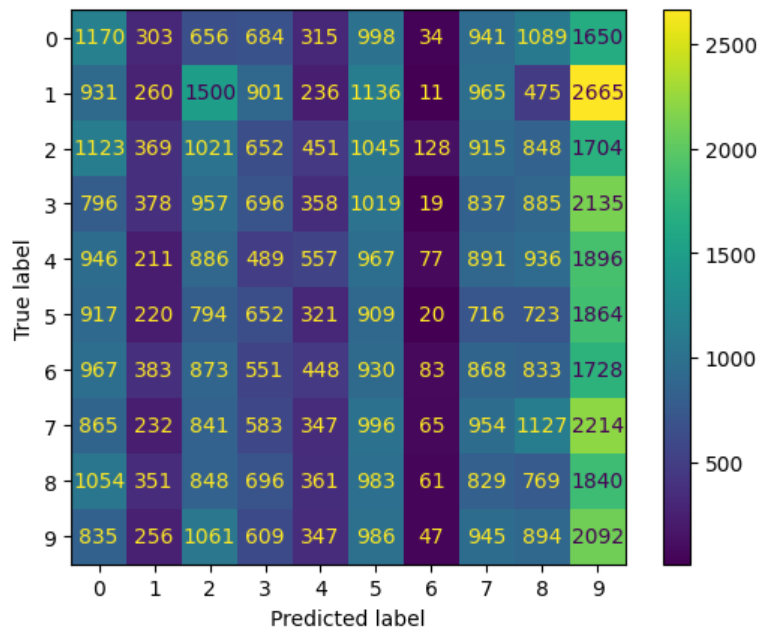


  The MLP model has provided  near satisfactory results for the image classification problem of the MNIST dataset. The model has almost predicted most of the classes with following observations:

  1. Correct Classifications: The correct classifications lie along the diagonal of the matrix with following numbers->

  * Class 0: 1170
  * Class 1: 1500
  * Class 2: 1021
  * Class 3: 1019
  * Class 4: 886
  * Class 5: 909
  * Class 6: 930
  * Class 7: 996
  * Class 8: 983
  * Class 9: 986
   
   2. Misclassifications: The misclassifications in the model are as follows->
   * Some notable misclassifications:

   a. Class 9 is frequently misclassified across all true labels, indicating a potential issue with distinguishing this class from others.
Misclassifications between Class 6 and Class 9 are prominent, which suggests that the features of these classes might be similar or the model struggles to distinguish between them.

 b. Class 0 and Class 9:
There is a significant number of misclassifications between Class 0 and Class 9. This indicates that the model may have difficulty differentiating these classes, possibly due to similar feature representations.

  c.Class 1 and Class 9:
  Class 1 shows a high number of misclassifications with Class 9. This could be due to similarities in features or potential issues with the data representation of these classes.

  d. Class 8 Misclassifications: Class 8 also has a high number of misclassifications, particularly with Class 9, which indicates that these classes have overlapping features that the model struggles to differentiate.
  * General Observations:

    a. High True Positives: The model achieves high accuracy for all classes, particularly for Classes 1, 3, 4, 5, 7, and 9, with true positive values close to or exceeding 900.

  
 4. MLP Model (FashionMNIST dataset):
    
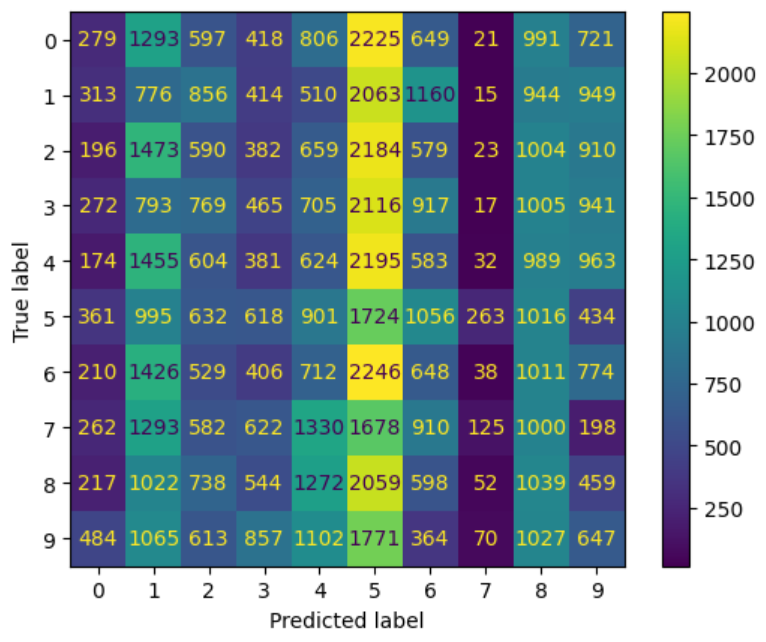

The MLP model has provided comparatively less accurate  results for the image classification problem of the FashionMNIST dataset. The model has almost predicted most of the classes with following observations:

  1. Correct Classifications: The correct classifications lie along the diagonal of the matrix with following numbers->

  * Class 0: 279
  * Class 1: 776
  * Class 2: 590
  * Class 3: 705
  * Class 4: 583
  * Class 5: 1724
  * Class 6: 712
  * Class 7: 1330
  * Class 8: 598
  * Class 9: 647
   
  2. Misclassifications: The misclassifications in the model are as follows->
  * Some notable misclassifications:

    * Class 0: Heavily misclassified as Class 5 (2225 times).
    * Class 2: Frequently misclassified as Class 4 (2184 times).
    * Class 3: Also often confused with Class 4 (2116 times).
    * Class 6: Misclassified as Class 5 (2246 times).
    * Class 8: Misclassified as Class 5 (2059 times).
    * Class 9: Misclassified as Class 5 (1771 times).

  * General Observations:

    a. Class Imbalance in Misclassifications: Class 5 (on the predicted label side) has a large number of entries across multiple rows, meaning that other classes are often incorrectly predicted as Class 5. This suggests that the model may be biased towards predicting Class 5 or that Class 5 shares features with multiple other classes, leading to higher misclassifications.

    b. Confusion Between Specific Pairs: The frequent misclassifications between Classes 0 & 5, 2 & 4, 3 & 4, and 6 & 5 indicate that these pairs might be visually similar or share feature overlaps in the dataset.

    c. High Correct Classifications for Certain Classes: Classes like 5 and 7 have relatively high numbers of correct classifications (1724 and 1330, respectively), suggesting that the model can identify these classes more accurately.





